<a href="https://colab.research.google.com/github/shriju/ANN/blob/main/sales_project_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
data = pd.read_csv('/content/Superstore-Sales.csv', encoding='latin1')[0:1000]
data.head(10)

,Row ID,Order ID,Order Date,Order Priority,Order Quantity,Sales,Discount,Ship Mode,Profit,Unit Price,Shipping Cost,Customer Name,Province,Region,Customer Segment,Product Category,Product Sub-Category,Product Name,Product Container,Product Base Margin,Ship Date
0,1,3,10/13/2010,Low,6,261.5400,0.04,Regular Air,-213.25,38.94,35.00,Muhammed MacIntyre,Nunavut,Nunavut,Small Business,Office Supplies,Storage & Organization,"Eldon Base for stackable storage shelf, platinum",Large Box,0.80,10/20/2010
1,49,293,10/1/2012,High,49,10123.0200,0.07,Delivery Truck,457.81,208.16,68.02,Barry French,Nunavut,Nunavut,Consumer,Office Supplies,Appliances,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Jumbo Drum,0.58,10/2/2012
2,50,293,10/1/2012,High,27,244.5700,0.01,Regular Air,46.71,8.69,2.99,Barry French,Nunavut,Nunavut,Consumer,Office Supplies,Binders and Binder Accessories,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Small Box,0.39,10/3/2012
3,80,483,7/10/2011,High,30,4965.7595,0.08,Regular Air,1198.97,195.99,3.99,Clay Rozendal,Nunavut,Nunavut,Corporate,Technology,Telephones and Communication,R380,Small Box,0.58,7/12/2011
4,85,515,8/28/2010,Not Specified,19,394.2700,0.08,Regular Air,30.94,21.78,5.94,Carlos Soltero,Nunavut,Nunavut,Consumer,Office Supplies,Appliances,Holmes HEPA Air Purifier,Medium Box,0.50,8/30/2010
5,86,515,8/28/2010,Not Specified,21,146.6900,0.05,Regular Air,4.43,6.64,4.95,Carlos Soltero,Nunavut,Nunavut,Consumer,Furniture,Office Furnishings,G.E. Longer-Life Indoor Recessed Floodlight Bulbs,Small Pack,0.37,8/30/2010
6,97,613,6/17/2011,High,12,93.5400,0.03,Regular Air,-54.04,7.30,7.72,Carl Jackson,Nunavut,Nunavut,Corporate,Office Supplies,Binders and Binder Accessories,"Angle-D Binders with Locking Rings, Label Holders",Small Box,0.38,6/17/2011
7,98,613,6/17/2011,High,22,905.0800,0.09,Regular Air,127.70,42.76,6.22,Carl Jackson,Nunavut,Nunavut,Corporate,Office Supplies,Storage & Organization,"SAFCO Mobile Desk Side File, Wire Frame",Small Box,NaN,6/18/2011
8,103,643,3/24/2011,High,21,2781.8200,0.07,Express Air,-695.26,138.14,35.00,Monica Federle,Nunavut,Nunavut,Corporate,Office Supplies,Storage & Organization,"SAFCO Commercial Wire Shelving, Black",Large Box,NaN,3/25/2011
9,107,678,2/26/2010,Low,44,228.4100,0.07,Regular Air,-226.36,4.98,8.33,Dorothy Badders,Nunavut,Nunavut,Home Office,Office Supplies,Paper,Xerox 198,Small Box,0.38,2/26/2010


### Sales Table

sales_id, product_id, customer_id, sales_amount, date, region_id (1,101,201,100,2022-01-01,1)

In [ ]:
sales_table = data[['Order Date','Order Quantity']]
sales_table['Sales ID'] = np.arange(101, len(sales_table ) + 101)
sales_table.head(5)

<ipython-input-70-3eee395191dc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_table['Sales ID'] = np.arange(101, len(sales_table ) + 101)


,Order Date,Order Quantity,Sales ID
0,10/13/2010,6,101
1,10/1/2012,49,102
2,10/1/2012,27,103
3,7/10/2011,30,104
4,8/28/2010,19,105


### Products Table

product_id, product_name, category, price (101,Product A,Electronics,500)

In [ ]:
products_table = data[['Product Name','Product Sub-Category', 'Product Category', 'Discount', 'Unit Price','Product Base Margin']]
products_table.head(5)

,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin
0,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80
1,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58
2,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39
3,R380,Telephones and Communication,Technology,0.08,195.99,0.58
4,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50


### Adding Sales Column as calculated field

In [ ]:
products_table['Discounted Unit Price'] = products_table['Unit Price'] * (1 - products_table['Discount'])
sales_table["Sales"] = products_table['Discounted Unit Price'] * sales_table["Order Quantity"]
sales_table.head()

<ipython-input-73-3b9bc360e441>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_table['Discounted Unit Price'] = products_table['Unit Price'] * (1 - products_table['Discount'])
<ipython-input-73-3b9bc360e441>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_table["Sales"] = products_table['Discounted Unit Price'] * sales_table["Order Quantity"]


,Order Date,Order Quantity,Sales ID,Sales
0,10/13/2010,6,101,224.2944
1,10/1/2012,49,102,9485.8512
2,10/1/2012,27,103,232.2837
3,7/10/2011,30,104,5409.3240
4,8/28/2010,19,105,380.7144


### Adding Profit Column as calculated field

In [ ]:
products_table['Unit Cost'] = products_table['Unit Price'] * (1 - products_table['Product Base Margin'])
products_table['Profit'] = sales_table['Sales'] - (sales_table['Order Quantity'] * products_table['Unit Cost'])
products_table.head()

<ipython-input-74-7472ad0ee2f3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_table['Unit Cost'] = products_table['Unit Price'] * (1 - products_table['Product Base Margin'])
<ipython-input-74-7472ad0ee2f3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  products_table['Profit'] = sales_table['Sales'] - (sales_table['Order Quantity'] * products_table['Unit Cost'])


,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Discounted Unit Price,Unit Cost,Profit
0,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,37.3824,7.7880,177.5664
1,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,193.5888,87.4272,5201.9184
2,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,8.6031,5.3009,89.1594
3,R380,Telephones and Communication,Technology,0.08,195.99,0.58,180.3108,82.3158,2939.8500
4,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,20.0376,10.8900,173.8044


In [ ]:
columns_to_drop = ['Discounted Unit Price','Unit Cost']
products_table = products_table.drop(columns=columns_to_drop)

In [ ]:
#products_table.duplicated(subset=['Product Name'])

In [ ]:
#products_table = products_table.drop_duplicates(subset=['Product Name'])

### Adding Product ID Column in reference to Product Category

In [ ]:
# Get unique product names
unique_product_names = data['Product Name'].unique()

# Create a dictionary to map each unique product name to a unique ID
product_id_map = {}
product_counter = {}

for product_name in unique_product_names:
    category_prefix = data.loc[data['Product Name'] == product_name, 'Product Category'].iloc[0][:2].upper()
    if category_prefix not in product_counter:
        product_counter[category_prefix] = 1
    else:
        product_counter[category_prefix] += 1
    product_id_map[product_name] = f"{category_prefix}_{product_counter[category_prefix]:02d}"

# Add a new column 'Product ID' based on the mapping
products_table['Product ID'] = products_table['Product Name'].map(product_id_map)
products_table.head(5)

,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID
0,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01
1,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02
2,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03
3,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01
4,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04


### Adding Advertising Expenditure Column in reference to Product Category

In [ ]:
unique_categories = products_table['Product Category'].unique()
unique_categories

array(['Office Supplies', 'Technology', 'Furniture'], dtype=object)

In [ ]:
# Define a function to calculate advertising expenditure based on unit price and product category
def calculate_advertising_expenditure(unit_price, product_category):
    if product_category == 'Office Supplies':
        return unit_price * 0.05
    elif product_category == 'Technology':
        return unit_price * 0.15
    elif product_category == 'Furniture':
        return unit_price * 0.10
    else:
        return unit_price * 0.10  # Default to 10% for other categories

# Apply the function to create a new column for advertising expenditure
products_table['Advertising Expenditure'] = products_table.apply(lambda row: calculate_advertising_expenditure(row['Unit Price'], row['Product Category']), axis=1)

# Print the DataFrame to see the new column
products_table.head()

,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure
0,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470
1,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02,10.4080
2,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03,0.4345
3,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01,29.3985
4,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04,1.0890


### Adding Sales Representative Column in reference to Product Category

In [ ]:
# Define a function to randomly assign sales representatives based on product category
def assign_sales_representative(product_category):
    if product_category == 'Office Supplies':
        return np.random.randint(1, 3)
    elif product_category == 'Technology':
        return np.random.randint(1, 4)
    elif product_category == 'Furniture':
        return np.random.randint(2, 5)
    else:
        return np.random.randint(1, 3)

# Apply the function to create a new column for sales representative
products_table['Sales Representative'] = products_table['Product Category'].apply(assign_sales_representative)
products_table.head()

,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative
0,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470,2
1,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02,10.4080,2
2,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03,0.4345,2
3,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01,29.3985,3
4,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04,1.0890,1


### Adding Product Review Column in reference to Product Sub-Category

In [ ]:
uni_cat_count = data['Product Sub-Category'].value_counts()
print(uni_cat_count)

Paper                             129
Binders and Binder Accessories    120
Telephones and Communication      104
Office Furnishings                100
Computer Peripherals               90
Storage & Organization             68
Pens & Art Supplies                63
Chairs & Chairmats                 61
Appliances                         50
Labels                             39
Office Machines                    35
Tables                             32
Envelopes                          29
Bookcases                          26
Scissors, Rulers and Trimmers      21
Rubber Bands                       19
Copiers and Fax                    14
Name: Product Sub-Category, dtype: int64


In [ ]:
# Create a dictionary mapping review descriptions to numerical ratings
'''review_mapping = {
    'poor': 1,
    'fair': 2,
    'average': 3,
    'good': 4,
    'very good': 5
}'''

# Create a dictionary mapping product sub-categories to review rating ranges
review_rating_ranges = {
    'Paper': (3, 5),
    'Binders and Binder Accessories': (3, 5),
    'Telephones and Communication': (1, 5),
    'Office Furnishings': (1, 5),
    'Computer Peripherals': (1, 5),
    'Storage & Organization': (3, 5),
    'Pens & Art Supplies': (3, 5),
    'Chairs & Chairmats': (1, 5),
    'Appliances': (1, 5),
    'Labels': (4,5),
    'Office Machines': (1,5),
    'Tables': (3, 5),
    'Envelopes': (4,5),
    'Bookcases': (4,5),
    'Scissors, Rulers and Trimmers': (4,5),
    'Rubber Bands': (4,5),
    'Copiers and Fax': (1,5)
}

# Define a function to randomly assign a review rating within the specified range for each sub-category
def assign_review_rating(sub_category):
    rating_range = review_rating_ranges.get(sub_category, (1, 5))  # Default to (1, 5) if sub-category not found
    return np.random.randint(rating_range[0], rating_range[1] + 1)

# Apply the function to create a new column for review ratings
products_table['Product Review Rating'] = products_table['Product Sub-Category'].apply(assign_review_rating)

products_table.head(5)

,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating
0,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470,2,5
1,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02,10.4080,2,1
2,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03,0.4345,2,4
3,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01,29.3985,3,1
4,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04,1.0890,1,3


### Customers Table

customer_id, customer_name, email, address (201,John Doe,john@example.com,123 Main St, City)

In [ ]:
n_data = pd.read_csv('/content/train.csv',encoding='latin1')[0:1000]
n_data.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680


In [ ]:
customers_table = pd.concat([n_data[['Customer ID', 'Customer Name']], data['Customer Segment']], axis=1)

customers_table.head()

,Customer ID,Customer Name,Customer Segment
0,CG-12520,Claire Gute,Small Business
1,CG-12520,Claire Gute,Consumer
2,DV-13045,Darrin Van Huff,Consumer
3,SO-20335,Sean O'Donnell,Corporate
4,SO-20335,Sean O'Donnell,Consumer


### Adding Email ID Column

In [ ]:
#customers_table = customers_table.drop_duplicates(subset=['Customer ID']).reset_index(True)

In [ ]:
first_names = customers_table['Customer Name'].str.split().str[0]
last_names = customers_table['Customer Name'].str.split().str[-1]
first_names_lower = first_names.str.lower()
last_names_lower = last_names.str.lower()
email_addresses = first_names_lower + '_' + last_names.str.lower() + '@example.com'
customers_table['Email ID'] = email_addresses
customers_table.head()

,Customer ID,Customer Name,Customer Segment,Email ID
0,CG-12520,Claire Gute,Small Business,claire_gute@example.com
1,CG-12520,Claire Gute,Consumer,claire_gute@example.com
2,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com
3,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com
4,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com


### Adding Address Column

In [ ]:
customers_table['Address'] = n_data['City'] + ', ' + n_data['State']
customers_table.head()

,Customer ID,Customer Name,Customer Segment,Email ID,Address
0,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky"
1,CG-12520,Claire Gute,Consumer,claire_gute@example.com,"Henderson, Kentucky"
2,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com,"Los Angeles, California"
3,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com,"Fort Lauderdale, Florida"
4,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com,"Fort Lauderdale, Florida"


### Regions Table

region_id, region_name

In [ ]:
region_table = n_data[['Region']]
unique_regions = n_data['Region'].unique()
region_id_mapping = {region: i + 1 for i, region in enumerate(unique_regions)}
region_table['Region ID'] = n_data['Region'].map(region_id_mapping)
region_table.head(5)

<ipython-input-89-f99fc50bd89f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  region_table['Region ID'] = n_data['Region'].map(region_id_mapping)


,Region,Region ID
0,South,1
1,South,1
2,West,2
3,South,1
4,South,1


### Final Sales Dataset

In [ ]:
sales_data = pd.concat([sales_table, products_table, customers_table, region_table], axis=1, join='inner')
sales_data

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
0,10/13/2010,6,101,224.2944,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470,2,5,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky",South,1
1,10/1/2012,49,102,9485.8512,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02,10.4080,2,1,CG-12520,Claire Gute,Consumer,claire_gute@example.com,"Henderson, Kentucky",South,1
2,10/1/2012,27,103,232.2837,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03,0.4345,2,4,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com,"Los Angeles, California",West,2
3,7/10/2011,30,104,5409.3240,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01,29.3985,3,1,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
4,8/28/2010,19,105,380.7144,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04,1.0890,1,3,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
5,8/28/2010,21,106,132.4680,G.E. Longer-Life Indoor Recessed Floodlight Bulbs,Office Furnishings,Furniture,0.05,6.64,0.37,44.6208,FU_01,0.6640,3,4,BH-11710,Brosina Hoffman,Consumer,brosina_hoffman@example.com,"Los Angeles, California",West,2
6,6/17/2011,12,107,84.9720,"Angle-D Binders with Locking Rings, Label Holders",Binders and Binder Accessories,Office Supplies,0.03,7.30,0.38,30.6600,OF_05,0.3650,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
7,6/17/2011,22,108,856.0552,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,NaN,NaN,OF_06,2.1380,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,3/24/2011,21,109,2697.8742,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,NaN,NaN,OF_07,6.9070,1,3,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
9,2/26/2010,44,110,203.7816,Xerox 198,Paper,Office Supplies,0.07,4.98,0.38,67.9272,OF_08,0.2490,1,4,BH-11710,Brosina Hoffman,Home Office,brosina_hoffman@example.com,"Los Angeles, California",West,2


In [ ]:
# Splitting data into separate DataFrames for each table
sales_table = result_data[['Order ID', 'Product ID', 'Customer ID', 'Sales', 'Order Date','Order Quantity','Region ID']]
products_table = result_data[['Product ID', 'Product Name','Product Sub-Category', 'Product Category', 'Discount', 'Profit', 'Unit Price', 'Advertising Expenditure','Sales Representative', 'Product Review Rating']]
customers_table = result_data[['Customer ID', 'Customer Name','Customer Segment', 'Email ID', 'Address']]
regions_table = result_data[['Region', 'Region ID']]

# Saving DataFrames to CSV files
sales_table.to_csv('sales_table.csv', index=False)
products_table.to_csv('products_table.csv', index=False)
customers_table.to_csv('customers_table.csv', index=False)
regions_table.to_csv('regions_table.csv', index=False)

In [ ]:
missing_values = sales_data.isnull().any()

print("Columns with missing values:")
print(missing_values[missing_values].index.tolist())

In [ ]:
sales_data.to_csv('sales_data.csv', index=False)

### Creating Seperate Data Tables for Database storage

In [ ]:
missing_values = sales_data.isnull().any()

print("Columns with missing values:")
print(missing_values[missing_values].index.tolist())

In [ ]:
# Fill missing values with the mean
sales_data['Product Base Margin'].fillna(sales_data['Product Base Margin'].mean(), inplace=True)
sales_data['Profit'].fillna(sales_data['Profit'].mean(), inplace=True)

In [ ]:
products_table = sales_data[['Product ID','Product Name','Product Category', 'Unit Price']]
products_table = products_table.drop_duplicates(subset=['Product ID'])
products_table.to_csv('products_table.csv', index=False)

In [ ]:
products_table

In [ ]:
customers_table = sales_data[['Customer ID', 'Customer Name', 'Email ID', 'Address']]
customers_table = customers_table.drop_duplicates(subset=['Customer ID'])
customers_table.to_csv('customers_table.csv', index=False)

In [ ]:
customers_table

In [ ]:
regions_table = sales_data[['Region', 'Region ID']]
regions_table.drop_duplicates().to_csv('regions_table.csv', index=False)

In [ ]:
sales_table = sales_data[['Sales ID', 'Product ID', 'Customer ID', 'Sales', 'Order Date','Region ID']]
sales_table.to_csv('sales_table.csv', index=False)

In [ ]:
sales_table

In [ ]:
try:
    # Try reading the CSV file with UTF-8 encoding
    df = pd.read_csv('/content/main_sales.csv')
except UnicodeDecodeError:
    # If UTF-8 decoding fails, try reading with a different encoding
    df = pd.read_csv('/content/main_sales.csv', encoding='ISO-8859-1')

### Level 1: Data Loading and Basic Analysis

1.1 Load the sales dataset (e.g., 'sales.csv') into a Pandas DataFrame.

In [ ]:
sales_data = pd.read_csv('/content/sales_table.csv')


1.2. Display the first 5 rows of the dataset.

In [ ]:
print("First five rows of data: ")
sales_data.head()

First five rows of data: 


,Sales ID,Product ID,Customer ID,Sales,Order Date,Order Quantity,Region ID
0,101,OF_01,CG-12520,224.2944,10/13/2010,6,1
1,102,OF_02,CG-12520,9485.8512,10/1/2012,49,1
2,103,OF_03,DV-13045,232.2837,10/1/2012,27,2
3,104,TE_01,SO-20335,5409.3240,7/10/2011,30,1
4,105,OF_04,SO-20335,380.7144,8/28/2010,19,1


In [ ]:
print("First five rows of data: ")
print(sales_data[0:5])


First five rows of data: 
   Sales ID Product ID Customer ID      Sales  Order Date  Order Quantity  \
0       101      OF_01    CG-12520   224.2944  10/13/2010               6   
1       102      OF_02    CG-12520  9485.8512   10/1/2012              49   
2       103      OF_03    DV-13045   232.2837   10/1/2012              27   
3       104      TE_01    SO-20335  5409.3240   7/10/2011              30   
4       105      OF_04    SO-20335   380.7144   8/28/2010              19   

   Region ID  
0          1  
1          1  
2          2  
3          1  
4          1  


1.3. Check the shape (number of rows and columns) of the dataset.


In [ ]:
shape_of_sales = sales_data.shape
print('rows in dataset:', shape_of_sales[0])
print('colomns in dataset:', shape_of_sales[1])

rows in dataset: 1000
colomns in dataset: 7


1.4. Display basic statistics (mean, median, min, max) for the 'Sales' column.

In [ ]:
sales_data_mean = sales_data['Sales'].mean()
sales_data_median = sales_data['Sales'].median()
sales_data_min = sales_data['Sales'].min()
sales_data_max = sales_data['Sales'].max()
print('The average in sales: ',sales_data_mean)
print('The median in sales: ',sales_data_median)
print('The min value in sales: ',sales_data_min)
print('The max value in sales: ',sales_data_max)

The average in sales:  1792.3565458
The median in sales:  498.61744999999996
The min value in sales:  2.7648
The max value in sales:  27599.54


1.5. Determine the number of unique products sold.

In [ ]:
sales_data_unique = sales_data['Product ID'].value_counts().reset_index()
print("Number of Unique Products Sold:")
print(sales_data_unique)

Number of Unique Products Sold:
      index  Product ID
0     FU_13           6
1     TE_15           5
2     TE_21           5
3     OF_54           4
4     OF_95           4
5     OF_92           4
6     OF_96           4
7    OF_131           4
8     OF_25           4
9     TE_13           4
10    OF_86           4
11   OF_140           4
12   OF_163           4
13    OF_64           4
14    OF_68           4
15    FU_52           4
16    OF_21           4
17    TE_22           4
18    OF_39           3
19   OF_188           3
20    TE_79           3
21   OF_190           3
22   OF_271           3
23    TE_26           3
24   OF_274           3
25    FU_53           3
26    FU_08           3
27   OF_305           3
28   OF_195           3
29   OF_176           3
30    FU_11           3
31    FU_63           3
32   OF_157           3
33    OF_65           3
34    OF_62           3
35    TE_60           3
36   FU_106           3
37    FU_62           3
38    TE_72           3
39    FU

### Level 2: Data Cleaning and Preprocessing

In [ ]:
df.head()

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
0,10/13/2010,6,101,224.2944,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470,1,5,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky",South,1
1,10/1/2012,49,102,9485.8512,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02,10.4080,1,2,CG-12520,Claire Gute,Consumer,claire_gute@example.com,"Henderson, Kentucky",South,1
2,10/1/2012,27,103,232.2837,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03,0.4345,2,5,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com,"Los Angeles, California",West,2
3,7/10/2011,30,104,5409.3240,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01,29.3985,3,1,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
4,8/28/2010,19,105,380.7144,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04,1.0890,2,4,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1


In [ ]:
df['Order Date']=pd.to_datetime(df['Order Date'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Order Date               1000 non-null   datetime64[ns]
 1   Order Quantity           1000 non-null   int64         
 2   Sales ID                 1000 non-null   int64         
 3   Sales                    1000 non-null   float64       
 4   Product Name             1000 non-null   object        
 5   Product Sub-Category     1000 non-null   object        
 6   Product Category         1000 non-null   object        
 7   Discount                 1000 non-null   float64       
 8   Unit Price               1000 non-null   float64       
 9   Product Base Margin      990 non-null    float64       
 10  Profit                   990 non-null    float64       
 11  Product ID               1000 non-null   object        
 12  Advertising Expenditure  1000 non-n

In [ ]:
df.isnull().sum()

Order Date                  0
Order Quantity              0
Sales ID                    0
Sales                       0
Product Name                0
Product Sub-Category        0
Product Category            0
Discount                    0
Unit Price                  0
Product Base Margin        10
Profit                     10
Product ID                  0
Advertising Expenditure     0
Sales Representative        0
Product Review Rating       0
Customer ID                 0
Customer Name               0
Customer Segment            0
Email ID                    0
Address                     0
Region                      0
Region ID                   0
dtype: int64

Finding Duplicated rows

In [ ]:
df.duplicated().sum() # no duplicate rows in the dataset

0

2.1. Handle missing values by filling them with appropriate values (e.g., mean or median).

In [ ]:
df[df['Profit'].isnull() | df['Product Base Margin'].isnull()] # Extracting only columns from Profit and Product Base Margin values are missing

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
7,2011-06-17,22,108,856.0552,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,NaN,NaN,OF_06,2.138,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,2011-03-24,21,109,2697.8742,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,NaN,NaN,OF_07,6.907,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
71,2011-08-07,22,172,5954.8720,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.02,276.20,NaN,NaN,FU_12,27.620,3,4,TB-21520,Tracy Blumstein,Corporate,tracy_blumstein@example.com,"Jackson, Michigan",Central,3
213,2011-08-10,17,314,5703.0240,SAFCO PlanMaster Heigh-Adjustable Drafting Tab...,Tables,Furniture,0.04,349.45,NaN,NaN,FU_44,34.945,4,4,VW-21775,Victoria Wilson,Small Business,victoria_wilson@example.com,"Medina, Ohio",East,4
274,2011-03-26,44,375,5774.2520,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.05,138.14,NaN,NaN,OF_07,6.907,2,5,BB-10990,Barry Blumstein,Corporate,barry_blumstein@example.com,"Inglewood, California",West,2
375,2010-03-29,31,476,8219.7120,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.04,276.20,NaN,NaN,FU_12,27.620,2,5,AG-10900,Arthur Gainer,Corporate,arthur_gainer@example.com,"Tucson, Arizona",West,2
441,2011-11-05,45,542,15253.4925,SAFCO PlanMaster Heigh-Adjustable Drafting Tab...,Tables,Furniture,0.03,349.45,NaN,NaN,FU_44,34.945,3,3,PK-19075,Pete Kriz,Small Business,pete_kriz@example.com,"Detroit, Michigan",Central,3
510,2011-08-25,37,611,4555.0848,SAFCO Folding Chair Trolley,Chairs & Chairmats,Furniture,0.04,128.24,NaN,NaN,FU_85,12.824,3,3,LS-17245,Lynn Smith,Home Office,lynn_smith@example.com,"Gladstone, Missouri",Central,3
601,2009-01-24,30,702,6436.8000,Safco Contoured Stacking Chairs,Chairs & Chairmats,Furniture,0.10,238.40,NaN,NaN,FU_99,23.840,3,3,CK-12205,Chloris Kastensmidt,Small Business,chloris_kastensmidt@example.com,"Philadelphia, Pennsylvania",East,4
905,2012-03-04,7,1006,1778.7280,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.08,276.20,NaN,NaN,FU_12,27.620,4,1,LC-17140,Logan Currie,Corporate,logan_currie@example.com,"Los Angeles, California",West,2


In [ ]:
df[df['Product Name'].str.startswith('SAFCO')] # Extracting all the rows that has SAFCO as missing rows are related to it.

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
7,2011-06-17,22,108,856.0552,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,NaN,NaN,OF_06,2.138,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,2011-03-24,21,109,2697.8742,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,NaN,NaN,OF_07,6.907,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
71,2011-08-07,22,172,5954.8720,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.02,276.20,NaN,NaN,FU_12,27.620,3,4,TB-21520,Tracy Blumstein,Corporate,tracy_blumstein@example.com,"Jackson, Michigan",Central,3
213,2011-08-10,17,314,5703.0240,SAFCO PlanMaster Heigh-Adjustable Drafting Tab...,Tables,Furniture,0.04,349.45,NaN,NaN,FU_44,34.945,4,4,VW-21775,Victoria Wilson,Small Business,victoria_wilson@example.com,"Medina, Ohio",East,4
274,2011-03-26,44,375,5774.2520,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.05,138.14,NaN,NaN,OF_07,6.907,2,5,BB-10990,Barry Blumstein,Corporate,barry_blumstein@example.com,"Inglewood, California",West,2
375,2010-03-29,31,476,8219.7120,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.04,276.20,NaN,NaN,FU_12,27.620,2,5,AG-10900,Arthur Gainer,Corporate,arthur_gainer@example.com,"Tucson, Arizona",West,2
441,2011-11-05,45,542,15253.4925,SAFCO PlanMaster Heigh-Adjustable Drafting Tab...,Tables,Furniture,0.03,349.45,NaN,NaN,FU_44,34.945,3,3,PK-19075,Pete Kriz,Small Business,pete_kriz@example.com,"Detroit, Michigan",Central,3
510,2011-08-25,37,611,4555.0848,SAFCO Folding Chair Trolley,Chairs & Chairmats,Furniture,0.04,128.24,NaN,NaN,FU_85,12.824,3,3,LS-17245,Lynn Smith,Home Office,lynn_smith@example.com,"Gladstone, Missouri",Central,3
905,2012-03-04,7,1006,1778.7280,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.08,276.20,NaN,NaN,FU_12,27.620,4,1,LC-17140,Logan Currie,Corporate,logan_currie@example.com,"Los Angeles, California",West,2


In [ ]:
df[df['Product Sub-Category'].str.startswith('Storage')]

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
0,2010-10-13,6,101,224.2944,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470,1,5,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky",South,1
7,2011-06-17,22,108,856.0552,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,NaN,NaN,OF_06,2.1380,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,2011-03-24,21,109,2697.8742,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,NaN,NaN,OF_07,6.9070,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
28,2010-11-08,28,129,362.3424,Tenex Personal Project File with Scoop Front D...,Storage & Organization,Office Supplies,0.04,13.48,0.59,207.5920,OF_18,0.6740,2,4,TB-21520,Tracy Blumstein,Consumer,tracy_blumstein@example.com,"Philadelphia, Pennsylvania",East,4
66,2010-06-04,40,167,401.1200,Crate-A-Files,Storage & Organization,Office Supplies,0.08,10.90,0.59,222.3600,OF_41,0.5450,2,3,PS-18970,Paul Stevenson,Consumer,paul_stevenson@example.com,"Chicago, Illinois",Central,3
77,2012-05-04,40,178,3239.2000,Carina Double Wide Media Storage Towers in Nat...,Storage & Organization,Office Supplies,0.00,80.98,0.81,2623.7520,OF_46,4.0490,1,5,KB-16600,Ken Brennan,Small Business,ken_brennan@example.com,"Houston, Texas",Central,3
84,2011-10-10,7,185,1878.1056,"Tennsco Snap-Together Open Shelving Units, Sta...",Storage & Organization,Office Supplies,0.04,279.48,0.80,1486.8336,OF_52,13.9740,2,3,CS-12400,Christopher Schild,Corporate,christopher_schild@example.com,"Chicago, Illinois",Central,3
100,2012-11-29,48,201,4796.4960,Fellowes Recycled Storage Drawers,Storage & Organization,Office Supplies,0.10,111.03,0.78,3624.0192,OF_60,5.5515,2,3,RB-19465,Rick Bensley,Small Business,rick_bensley@example.com,"Chicago, Illinois",Central,3
106,2010-06-24,4,207,57.7760,Hanging Personal Folder File,Storage & Organization,Office Supplies,0.08,15.70,0.60,32.6560,OF_64,0.7850,1,4,JM-15250,Janet Martin,Corporate,janet_martin@example.com,"Charlotte, North Carolina",South,1
116,2010-02-09,28,217,575.6912,"Tennsco Lockers, Gray",Storage & Organization,Office Supplies,0.02,20.98,0.78,446.4544,OF_66,1.0490,2,4,RC-19960,Ryan Crowe,Small Business,ryan_crowe@example.com,"Columbus, Ohio",East,4


df['Profit']=df['Profit'].fillna(df.mean())

Here, taking product sub category average to fill up the missing values.

In the 'Product Sub Category, We have missing values for:1)Storage & Organization, 2)Chairs & Chairmats, 3) Tables

Taking the average of those categories individually

In [ ]:
fill_storage_mean = df[df['Product Sub-Category'].str.contains('Storage & Organization')]

# Calculate the average of 'Product Base Margin' for 'Storage & Organization' 'Product Sub Category'
average_margin_stor = fill_storage_mean['Product Base Margin'].mean()

print("Average Product Base Margin for 'Storage & Organization':", average_margin_stor)

Average Product Base Margin for 'Storage & Organization': 0.6624615384615385


In [ ]:
filtered_chair_mean = df[df['Product Sub-Category'].str.contains('Chairs & Chairmats')]

# Calculate the average of 'Product Base Margin' for 'Chairs & Chairmats' 'Product Sub Category'
average_margin_chair = filtered_chair_mean['Product Base Margin'].mean()

print("Average Product Base Margin for 'Chairs & Chairmats':", average_margin_chair)

Average Product Base Margin for 'Chairs & Chairmats': 0.6183928571428572


In [ ]:
filtered_table_mean = df[df['Product Sub-Category'].str.contains('Tables')]

# Calculate the average of 'Product Base Margin'
average_margin_table = filtered_table_mean['Product Base Margin'].mean()

print("Average Product Base Margin for 'Tables':", average_margin_table)

Average Product Base Margin for 'Tables': 0.6950000000000001


In [ ]:
fill_product_margin=(average_margin_stor+average_margin_chair+average_margin_table)/3
fill_product_margin

0.6586181318681319

In [ ]:
df['Product Base Margin'].fillna(fill_product_margin, inplace=True)

In [ ]:
df[df['Profit'].isnull() | df['Product Base Margin'].isnull()] # we filled up the missing values for Bsse Margin,
                                                              # now need to fill up missing values for Profit

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
7,2011-06-17,22,108,856.0552,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,0.658618,NaN,OF_06,2.138,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,2011-03-24,21,109,2697.8742,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,0.658618,NaN,OF_07,6.907,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
71,2011-08-07,22,172,5954.8720,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.02,276.20,0.658618,NaN,FU_12,27.620,3,4,TB-21520,Tracy Blumstein,Corporate,tracy_blumstein@example.com,"Jackson, Michigan",Central,3
213,2011-08-10,17,314,5703.0240,SAFCO PlanMaster Heigh-Adjustable Drafting Tab...,Tables,Furniture,0.04,349.45,0.658618,NaN,FU_44,34.945,4,4,VW-21775,Victoria Wilson,Small Business,victoria_wilson@example.com,"Medina, Ohio",East,4
274,2011-03-26,44,375,5774.2520,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.05,138.14,0.658618,NaN,OF_07,6.907,2,5,BB-10990,Barry Blumstein,Corporate,barry_blumstein@example.com,"Inglewood, California",West,2
375,2010-03-29,31,476,8219.7120,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.04,276.20,0.658618,NaN,FU_12,27.620,2,5,AG-10900,Arthur Gainer,Corporate,arthur_gainer@example.com,"Tucson, Arizona",West,2
441,2011-11-05,45,542,15253.4925,SAFCO PlanMaster Heigh-Adjustable Drafting Tab...,Tables,Furniture,0.03,349.45,0.658618,NaN,FU_44,34.945,3,3,PK-19075,Pete Kriz,Small Business,pete_kriz@example.com,"Detroit, Michigan",Central,3
510,2011-08-25,37,611,4555.0848,SAFCO Folding Chair Trolley,Chairs & Chairmats,Furniture,0.04,128.24,0.658618,NaN,FU_85,12.824,3,3,LS-17245,Lynn Smith,Home Office,lynn_smith@example.com,"Gladstone, Missouri",Central,3
601,2009-01-24,30,702,6436.8000,Safco Contoured Stacking Chairs,Chairs & Chairmats,Furniture,0.10,238.40,0.658618,NaN,FU_99,23.840,3,3,CK-12205,Chloris Kastensmidt,Small Business,chloris_kastensmidt@example.com,"Philadelphia, Pennsylvania",East,4
905,2012-03-04,7,1006,1778.7280,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.08,276.20,0.658618,NaN,FU_12,27.620,4,1,LC-17140,Logan Currie,Corporate,logan_currie@example.com,"Los Angeles, California",West,2


In [ ]:
fill_profit=(df['Sales']*df['Product Base Margin'])-df['Advertising Expenditure'] # calculate profit= ((Sales * Profit Margin)- Advertizing Exp)

In [ ]:
df['Profit'].fillna(fill_profit, inplace=True) # filling up the missing values in profit

In [ ]:
df[df['Profit'].isnull() | df['Product Base Margin'].isnull()] # Now, there is not any missing values

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID


In [ ]:
df.isnull().sum() # No missing values

Order Date                 0
Order Quantity             0
Sales ID                   0
Sales                      0
Product Name               0
Product Sub-Category       0
Product Category           0
Discount                   0
Unit Price                 0
Product Base Margin        0
Profit                     0
Product ID                 0
Advertising Expenditure    0
Sales Representative       0
Product Review Rating      0
Customer ID                0
Customer Name              0
Customer Segment           0
Email ID                   0
Address                    0
Region                     0
Region ID                  0
dtype: int64

Identify and remove outliers from the dataset using appropriate techniques.

<ipython-input-22-319f7c5bd991>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Sales'])


<Axes: xlabel='Sales'>

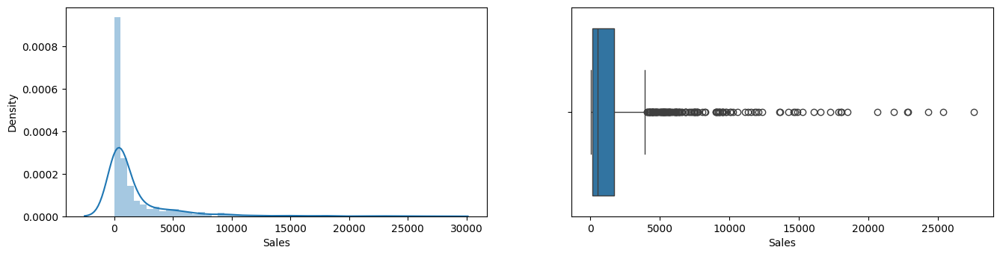

In [ ]:
# Finding the shape of the distribution in 'Sales' column in order to figure out which outlier handling technique should be used
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(df['Sales'])

plt.subplot(2,2,2)
sns.boxplot(x=df['Sales'])

In [ ]:
#The above figure shows that the data is skewed at the right side and there are many outliers, so decided to go with IQR method
# Finding the IQR, IQR=75th percentile-25th percentile
percentile25=df['Sales'].quantile(0.25)
percentile75=df['Sales'].quantile(0.75)

2.2. Convert categorical variables to numerical representation using one-hot encoding or label encoding. 3

In [ ]:
percentile25

158.47335

In [ ]:
percentile75

1706.2523999999999

In [ ]:
# Finding Interquartile range of the disbution
iqr=percentile75-percentile25
iqr

1547.7790499999999

In [ ]:
# Setting up upper limit and lower limit
upper_limit=iqr+1.5*iqr
lower_limit=iqr-1.5*iqr
print("Upper Limit", upper_limit)
print("Lower Limit", lower_limit)

Upper Limit 3869.447625
Lower Limit -773.8895249999998


In [ ]:
# Extracting rows greater than upper limit: Outlier rows: will be removed from the new dataset
df_higher_upper=df[df['Sales']>upper_limit]

In [ ]:
df_higher_upper # outlier rows

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
1,2012-10-01,49,102,9485.8512,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.580000,5201.918400,OF_02,10.4080,1,2,CG-12520,Claire Gute,Consumer,claire_gute@example.com,"Henderson, Kentucky",South,1
3,2011-07-10,30,104,5409.3240,R380,Telephones and Communication,Technology,0.08,195.99,0.580000,2939.850000,TE_01,29.3985,3,1,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
17,2012-02-14,44,118,4265.3952,Hon 4-Shelf Metal Bookcases,Bookcases,Furniture,0.04,100.98,0.600000,2488.147200,FU_03,10.0980,2,5,AG-10270,Alejandro Grove,Home Office,alejandro_grove@example.com,"West Jordan, Utah",West,2
27,2010-12-23,25,128,11137.2525,Canon PC940 Copier,Copiers and Fax,Technology,0.01,449.99,0.380000,4162.407500,TE_06,67.4985,3,2,TB-21520,Tracy Blumstein,Corporate,tracy_blumstein@example.com,"Philadelphia, Pennsylvania",East,4
37,2009-10-09,49,138,5394.4982,Hon Every-Day® Chair Series Swivel Task Chairs,Chairs & Chairmats,Furniture,0.09,120.98,0.640000,3260.411000,FU_06,12.0980,2,1,SN-20710,Steve Nguyen,Corporate,steve_nguyen@example.com,"Houston, Texas",Central,3
39,2010-12-09,30,140,13676.7540,Global Troy Executive Leather Low-Back Tilter,Chairs & Chairmats,Furniture,0.09,500.98,0.600000,7664.994000,FU_07,50.0980,4,4,SN-20710,Steve Nguyen,Consumer,steve_nguyen@example.com,"Houston, Texas",Central,3
48,2011-08-31,30,149,4632.9030,LX 788,Telephones and Communication,Technology,0.01,155.99,0.580000,2667.429000,TE_04,23.3985,2,1,LH-16900,Lena Hernandez,Home Office,lena_hernandez@example.com,"Dover, Delaware",East,4
60,2009-03-20,6,161,9432.1728,High Speed Automatic Electric Letter Opener,"Scissors, Rulers and Trimmers",Office Supplies,0.04,1637.53,0.810000,7565.388600,OF_35,81.8765,2,4,TB-21055,Ted Butterfield,Corporate,ted_butterfield@example.com,"Troy, New York",East,4
71,2011-08-07,22,172,5954.8720,SAFCO Arco Folding Chair,Chairs & Chairmats,Furniture,0.02,276.20,0.658618,3894.366672,FU_12,27.6200,3,4,TB-21520,Tracy Blumstein,Corporate,tracy_blumstein@example.com,"Jackson, Michigan",Central,3
85,2012-10-07,36,186,11324.1744,Hon 4070 Series Pagoda Round Back Stacking Ch...,Chairs & Chairmats,Furniture,0.02,320.98,0.570000,6355.404000,FU_15,32.0980,2,4,PO-18865,Patrick O'Donnell,Home Office,patrick_o'donnell@example.com,"Columbia, South Carolina",South,1


In [ ]:
df[df['Sales']<lower_limit] # doesn't have any meaning as sales cannot be less than zero.

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID


 Outlier Removal Technique 1: Trimming

In [ ]:
new_df1=df[df['Sales']<upper_limit] # Rows that are within the boundary: inlier rows

In [ ]:
new_df1

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
0,2010-10-13,6,101,224.2944,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.800000,177.566400,OF_01,1.9470,1,5,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky",South,1
2,2012-10-01,27,103,232.2837,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.390000,89.159400,OF_03,0.4345,2,5,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com,"Los Angeles, California",West,2
4,2010-08-28,19,105,380.7144,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.500000,173.804400,OF_04,1.0890,2,4,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
5,2010-08-28,21,106,132.4680,G.E. Longer-Life Indoor Recessed Floodlight Bulbs,Office Furnishings,Furniture,0.05,6.64,0.370000,44.620800,FU_01,0.6640,3,3,BH-11710,Brosina Hoffman,Consumer,brosina_hoffman@example.com,"Los Angeles, California",West,2
6,2011-06-17,12,107,84.9720,"Angle-D Binders with Locking Rings, Label Holders",Binders and Binder Accessories,Office Supplies,0.03,7.30,0.380000,30.660000,OF_05,0.3650,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
7,2011-06-17,22,108,856.0552,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,0.658618,561.675477,OF_06,2.1380,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,2011-03-24,21,109,2697.8742,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,0.658618,1769.961866,OF_07,6.9070,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
9,2010-02-26,44,110,203.7816,Xerox 198,Paper,Office Supplies,0.07,4.98,0.380000,67.927200,OF_08,0.2490,2,3,BH-11710,Brosina Hoffman,Home Office,brosina_hoffman@example.com,"Los Angeles, California",West,2
10,2010-11-23,45,111,190.6740,Xerox 1980,Paper,Office Supplies,0.01,4.28,0.400000,75.114000,OF_09,0.2140,2,4,BH-11710,Brosina Hoffman,Home Office,brosina_hoffman@example.com,"Los Angeles, California",West,2
11,2010-11-23,32,112,121.3440,Advantus Map Pennant Flags and Round Head Tacks,Rubber Bands,Office Supplies,0.04,3.95,0.530000,61.936000,OF_10,0.1975,1,4,BH-11710,Brosina Hoffman,Home Office,brosina_hoffman@example.com,"Los Angeles, California",West,2


In [ ]:
new_df1.shape

(860, 22)

<ipython-input-34-6814a42dba32>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Sales'])
<ipython-input-34-6814a42dba32>:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df1['Sales'])


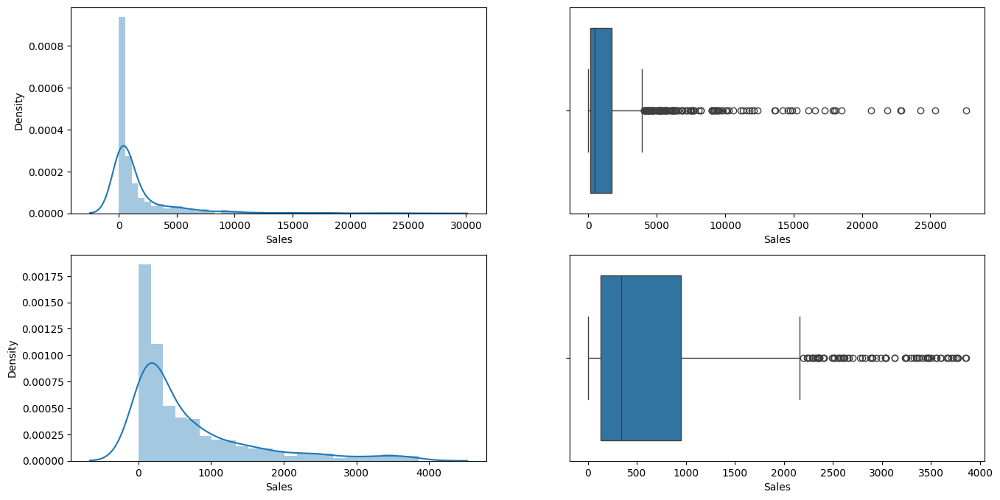

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(df['Sales'])

plt.subplot(2,2,2)
sns.boxplot(x=df['Sales'])

plt.subplot(2,2,3)
sns.distplot(new_df1['Sales'])

plt.subplot(2,2,4)
sns.boxplot(x=new_df1['Sales'])
plt.show()

Outlier Handling Technique 2: Capping

In [ ]:
# In the capping method, everything above the upper limit will be converted to upper limit and everything
# less than lower limit will be converted to lower limit.
new_df_cap=df.copy()
new_df_cap['Sales']=np.where(new_df_cap['Sales']>upper_limit, upper_limit,
                             np.where(new_df_cap['Sales']< lower_limit,
                                      lower_limit,
                                      new_df_cap['Sales'])
                             )

In [ ]:
new_df_cap

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
0,2010-10-13,6,101,224.294400,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.800000,177.566400,OF_01,1.9470,1,5,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky",South,1
1,2012-10-01,49,102,3869.447625,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.580000,5201.918400,OF_02,10.4080,1,2,CG-12520,Claire Gute,Consumer,claire_gute@example.com,"Henderson, Kentucky",South,1
2,2012-10-01,27,103,232.283700,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.390000,89.159400,OF_03,0.4345,2,5,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com,"Los Angeles, California",West,2
3,2011-07-10,30,104,3869.447625,R380,Telephones and Communication,Technology,0.08,195.99,0.580000,2939.850000,TE_01,29.3985,3,1,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
4,2010-08-28,19,105,380.714400,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.500000,173.804400,OF_04,1.0890,2,4,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
5,2010-08-28,21,106,132.468000,G.E. Longer-Life Indoor Recessed Floodlight Bulbs,Office Furnishings,Furniture,0.05,6.64,0.370000,44.620800,FU_01,0.6640,3,3,BH-11710,Brosina Hoffman,Consumer,brosina_hoffman@example.com,"Los Angeles, California",West,2
6,2011-06-17,12,107,84.972000,"Angle-D Binders with Locking Rings, Label Holders",Binders and Binder Accessories,Office Supplies,0.03,7.30,0.380000,30.660000,OF_05,0.3650,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
7,2011-06-17,22,108,856.055200,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,Office Supplies,0.09,42.76,0.658618,561.675477,OF_06,2.1380,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
8,2011-03-24,21,109,2697.874200,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,Office Supplies,0.07,138.14,0.658618,1769.961866,OF_07,6.9070,1,4,BH-11710,Brosina Hoffman,Corporate,brosina_hoffman@example.com,"Los Angeles, California",West,2
9,2010-02-26,44,110,203.781600,Xerox 198,Paper,Office Supplies,0.07,4.98,0.380000,67.927200,OF_08,0.2490,2,3,BH-11710,Brosina Hoffman,Home Office,brosina_hoffman@example.com,"Los Angeles, California",West,2


In [ ]:
# export_df.to_csv('gurgaon_properties_post_feature_selection.csv', index=False)
# Now, this is the main dataset for our analysis further
new_df_cap.to_csv("new_sales_data1.csv", index=False)

In [ ]:
new_df_cap.shape # Here, the shape didn't change as we used capping

(1000, 22)

<ipython-input-38-85119899ba7b>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Sales'])
<ipython-input-38-85119899ba7b>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df_cap['Sales'])


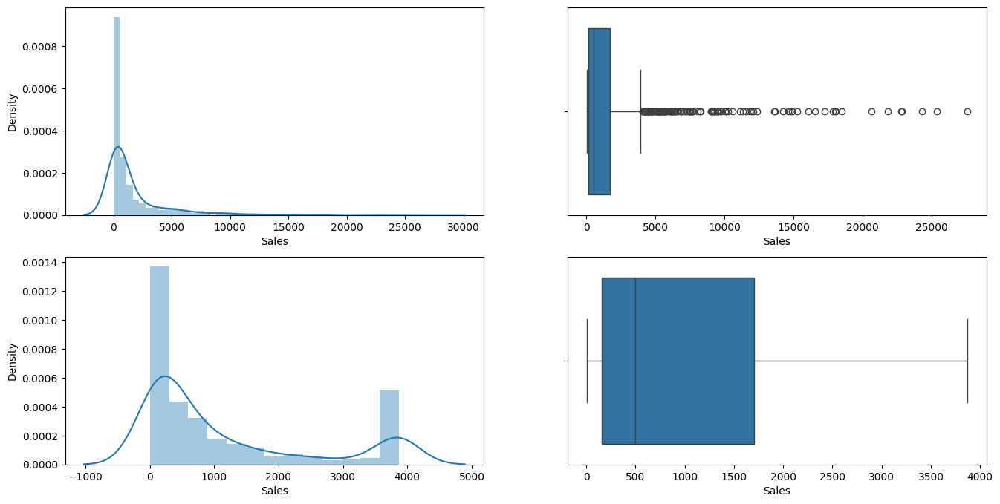

In [ ]:
# Analyzing the distribution of data in sales column before and after capping the outliers
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(df['Sales'])

plt.subplot(2,2,2)
sns.boxplot(x=df['Sales'])

plt.subplot(2,2,3)
sns.distplot(new_df_cap['Sales'])

plt.subplot(2,2,4)
sns.boxplot(x=new_df_cap['Sales'])
plt.show()

###Convert categorical variables to numerical representation using one-hot encoding or label encoding.

One Hot Encoding Using Pandas

In [ ]:
new_df_cap.head()

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Product Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Customer Segment,Email ID,Address,Region,Region ID
0,2010-10-13,6,101,224.294400,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,Office Supplies,0.04,38.94,0.80,177.5664,OF_01,1.9470,1,5,CG-12520,Claire Gute,Small Business,claire_gute@example.com,"Henderson, Kentucky",South,1
1,2012-10-01,49,102,3869.447625,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,Office Supplies,0.07,208.16,0.58,5201.9184,OF_02,10.4080,1,2,CG-12520,Claire Gute,Consumer,claire_gute@example.com,"Henderson, Kentucky",South,1
2,2012-10-01,27,103,232.283700,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,Office Supplies,0.01,8.69,0.39,89.1594,OF_03,0.4345,2,5,DV-13045,Darrin Van Huff,Consumer,darrin_huff@example.com,"Los Angeles, California",West,2
3,2011-07-10,30,104,3869.447625,R380,Telephones and Communication,Technology,0.08,195.99,0.58,2939.8500,TE_01,29.3985,3,1,SO-20335,Sean O'Donnell,Corporate,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1
4,2010-08-28,19,105,380.714400,Holmes HEPA Air Purifier,Appliances,Office Supplies,0.08,21.78,0.50,173.8044,OF_04,1.0890,2,4,SO-20335,Sean O'Donnell,Consumer,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1


performed One Hot Encoding for 'Customer Segment' and 'Product Category'

In [ ]:
new_df_cap['Customer Segment'].value_counts() # finding unique categoies for customere segment

Corporate         488
Home Office       208
Small Business    180
Consumer          124
Name: Customer Segment, dtype: int64

In [ ]:
new_df_cap['Product Category'].value_counts() # finding unique categories for 'Product Category'

Office Supplies    538
Technology         243
Furniture          219
Name: Product Category, dtype: int64

In [ ]:
# k-1 one hot encoding
pd.get_dummies(new_df_cap, columns=['Customer Segment', 'Product Category'], drop_first=True) # to remove the problem of multi coliniarity

,Order Date,Order Quantity,Sales ID,Sales,Product Name,Product Sub-Category,Discount,Unit Price,Product Base Margin,Profit,Product ID,Advertising Expenditure,Sales Representative,Product Review Rating,Customer ID,Customer Name,Email ID,Address,Region,Region ID,Customer Segment_Corporate,Customer Segment_Home Office,Customer Segment_Small Business,Product Category_Office Supplies,Product Category_Technology
0,2010-10-13,6,101,224.294400,"Eldon Base for stackable storage shelf, platinum",Storage & Organization,0.04,38.94,0.800000,177.566400,OF_01,1.9470,1,5,CG-12520,Claire Gute,claire_gute@example.com,"Henderson, Kentucky",South,1,0,0,1,1,0
1,2012-10-01,49,102,3869.447625,"1.7 Cubic Foot Compact ""Cube"" Office Refrigera...",Appliances,0.07,208.16,0.580000,5201.918400,OF_02,10.4080,1,2,CG-12520,Claire Gute,claire_gute@example.com,"Henderson, Kentucky",South,1,0,0,0,1,0
2,2012-10-01,27,103,232.283700,"Cardinal Slant-D® Ring Binder, Heavy Gauge Vinyl",Binders and Binder Accessories,0.01,8.69,0.390000,89.159400,OF_03,0.4345,2,5,DV-13045,Darrin Van Huff,darrin_huff@example.com,"Los Angeles, California",West,2,0,0,0,1,0
3,2011-07-10,30,104,3869.447625,R380,Telephones and Communication,0.08,195.99,0.580000,2939.850000,TE_01,29.3985,3,1,SO-20335,Sean O'Donnell,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1,1,0,0,0,1
4,2010-08-28,19,105,380.714400,Holmes HEPA Air Purifier,Appliances,0.08,21.78,0.500000,173.804400,OF_04,1.0890,2,4,SO-20335,Sean O'Donnell,sean_o'donnell@example.com,"Fort Lauderdale, Florida",South,1,0,0,0,1,0
5,2010-08-28,21,106,132.468000,G.E. Longer-Life Indoor Recessed Floodlight Bulbs,Office Furnishings,0.05,6.64,0.370000,44.620800,FU_01,0.6640,3,3,BH-11710,Brosina Hoffman,brosina_hoffman@example.com,"Los Angeles, California",West,2,0,0,0,0,0
6,2011-06-17,12,107,84.972000,"Angle-D Binders with Locking Rings, Label Holders",Binders and Binder Accessories,0.03,7.30,0.380000,30.660000,OF_05,0.3650,1,4,BH-11710,Brosina Hoffman,brosina_hoffman@example.com,"Los Angeles, California",West,2,1,0,0,1,0
7,2011-06-17,22,108,856.055200,"SAFCO Mobile Desk Side File, Wire Frame",Storage & Organization,0.09,42.76,0.658618,561.675477,OF_06,2.1380,1,4,BH-11710,Brosina Hoffman,brosina_hoffman@example.com,"Los Angeles, California",West,2,1,0,0,1,0
8,2011-03-24,21,109,2697.874200,"SAFCO Commercial Wire Shelving, Black",Storage & Organization,0.07,138.14,0.658618,1769.961866,OF_07,6.9070,1,4,BH-11710,Brosina Hoffman,brosina_hoffman@example.com,"Los Angeles, California",West,2,1,0,0,1,0
9,2010-02-26,44,110,203.781600,Xerox 198,Paper,0.07,4.98,0.380000,67.927200,OF_08,0.2490,2,3,BH-11710,Brosina Hoffman,brosina_hoffman@example.com,"Los Angeles, California",West,2,0,1,0,1,0


One Hot Encoding using Scikit Learn

In [ ]:
# pandas does not remember the columns exact position, which might change after the code rerun. for machine learning problems,
# we use OHE from scikit learn.
from sklearn.preprocessing import OneHotEncoder
ohe=OneHotEncoder(drop='first', sparse_output=False, dtype=np.int32) # removing the first column
ohe.fit_transform(new_df_cap[['Customer Segment', 'Product Category']])

array([[0, 0, 1, 1, 0],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 1, 0],
       ...,
       [0, 0, 1, 0, 1],
       [0, 0, 1, 0, 0],
       [0, 0, 1, 1, 0]], dtype=int32)

### Normalize the 'Sales' column to a scale between 0 and 1.

<Axes: xlabel='Profit', ylabel='Density'>

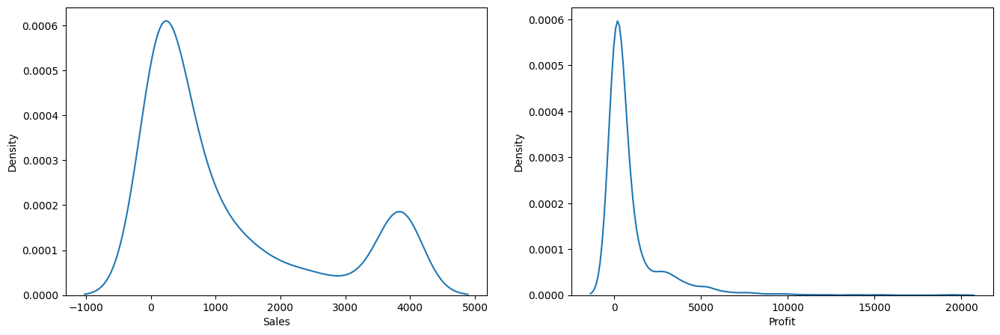

In [ ]:
# Using Min Max Scaling {(xi-xmean)/xmax-xmin} to scale the numerical values between 0 and 1:
# It helps the ML model to make better predictions
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
sns.kdeplot(new_df_cap['Sales'])

plt.subplot(1,2,2)
sns.kdeplot(new_df_cap['Profit'])

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
sales_values = new_df_cap[['Sales', 'Profit']]

scaler = MinMaxScaler()
scaled_sales = scaler.fit_transform(sales_values)

scaled_sales

array([[0.0572919 , 0.00912994],
       [1.        , 0.26894226],
       [0.05935809, 0.00455836],
       ...,
       [0.08836184, 0.00688471],
       [0.19672883, 0.01754161],
       [0.21024357, 0.0155548 ]])

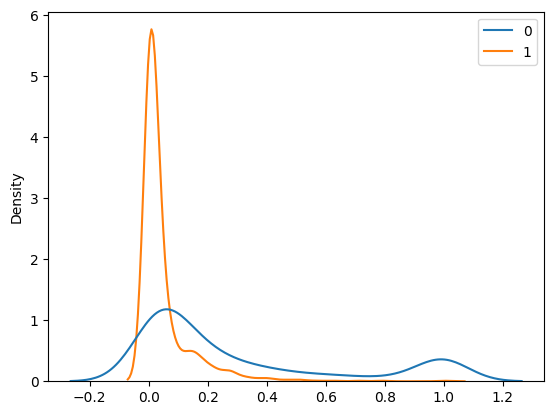

In [ ]:
#2 Distribution od data after applying Min-Max scaling for sales
sns.kdeplot(scaled_sales)
plt.show()

### Level 3 : Exploratory Data Analysis (EDA)

3.1. Visualize the distribution of sales amounts using a histogram.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sb
sb.set()

# Graphics in retina format are more sharp and legible
%config InlineBackend.figure_format = 'retina'

from pylab import rcParams
%matplotlib inline
rcParams['figure.figsize'] = 10, 8

[]

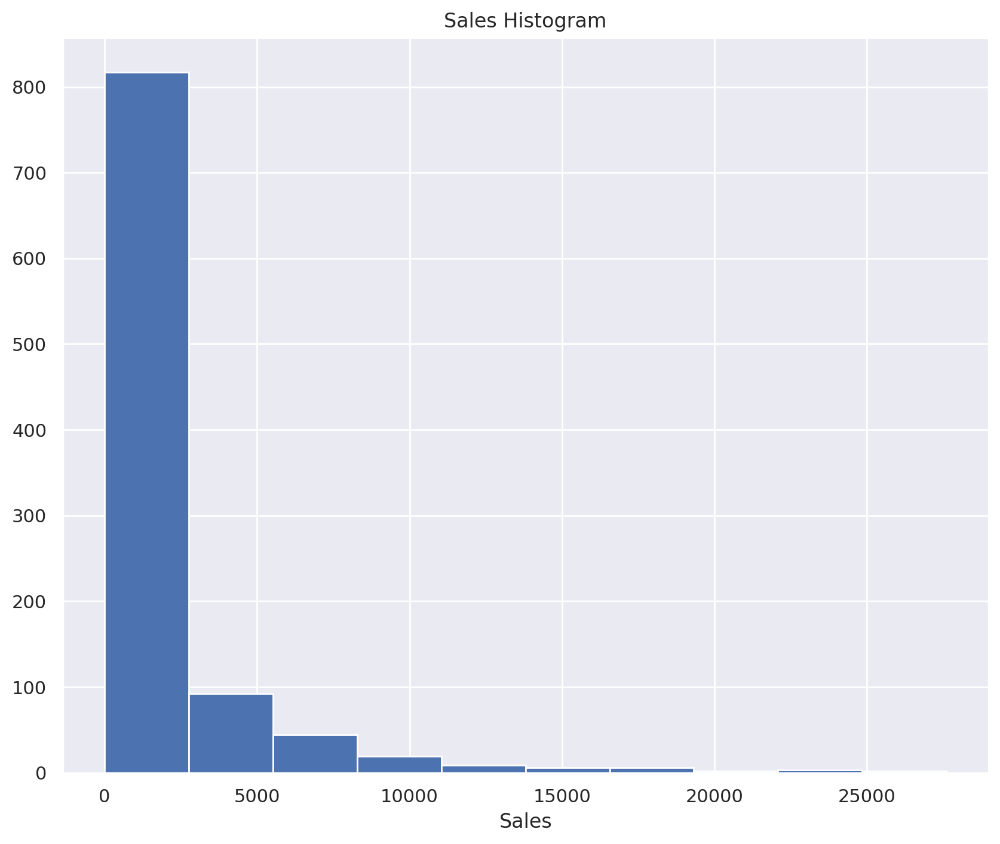

In [ ]:
sales_data=pd.read_csv("/content/sales_data (1).csv")
sales = sales_data["Sales"]
plt.hist(sales)
plt.title('Sales Histogram')
plt.xlabel('Sales')
plt.plot()

array([[<Axes: title={'center': 'Sales'}>,
        <Axes: title={'center': 'Order Quantity'}>],
       [<Axes: title={'center': 'Discount'}>,
        <Axes: title={'center': 'Profit'}>],
       [<Axes: title={'center': 'Unit Price'}>,
        <Axes: title={'center': 'Product Base Margin'}>]], dtype=object)

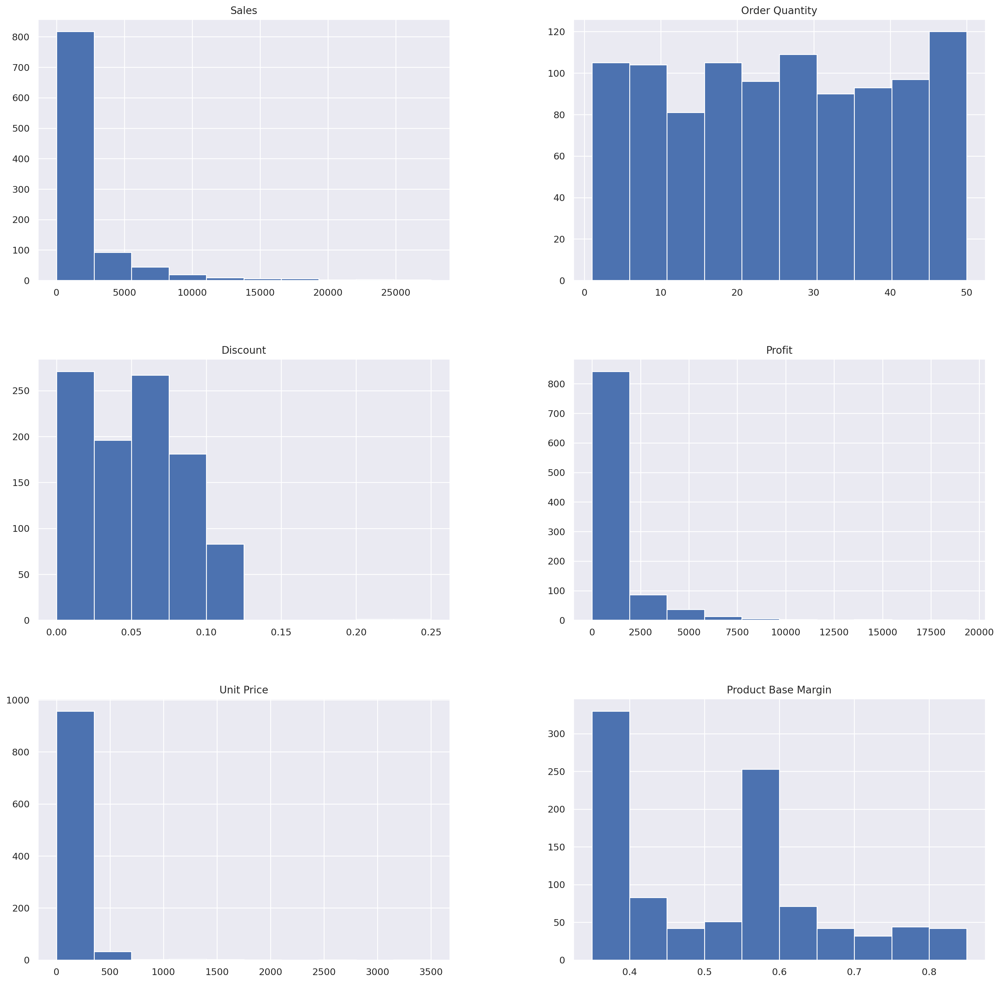

In [ ]:
num_variables = ['Sales','Order Quantity','Discount','Profit','Unit Price','Product Base Margin']
sales_data.hist(num_variables, figsize=(20,20))

3.2. Create a boxplot to identify any outliers in the sales data.

Text(0.5, 0, 'Sales')

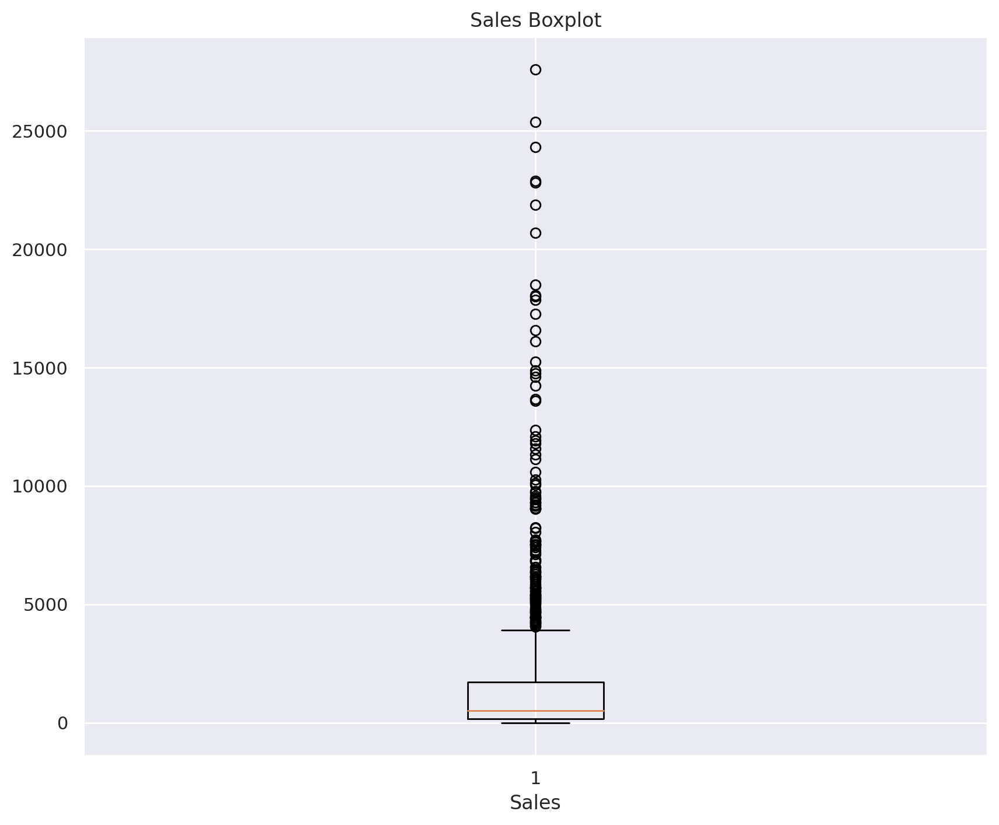

In [ ]:
plt.boxplot(sales)
plt.title('Sales Boxplot')
plt.xlabel('Sales')

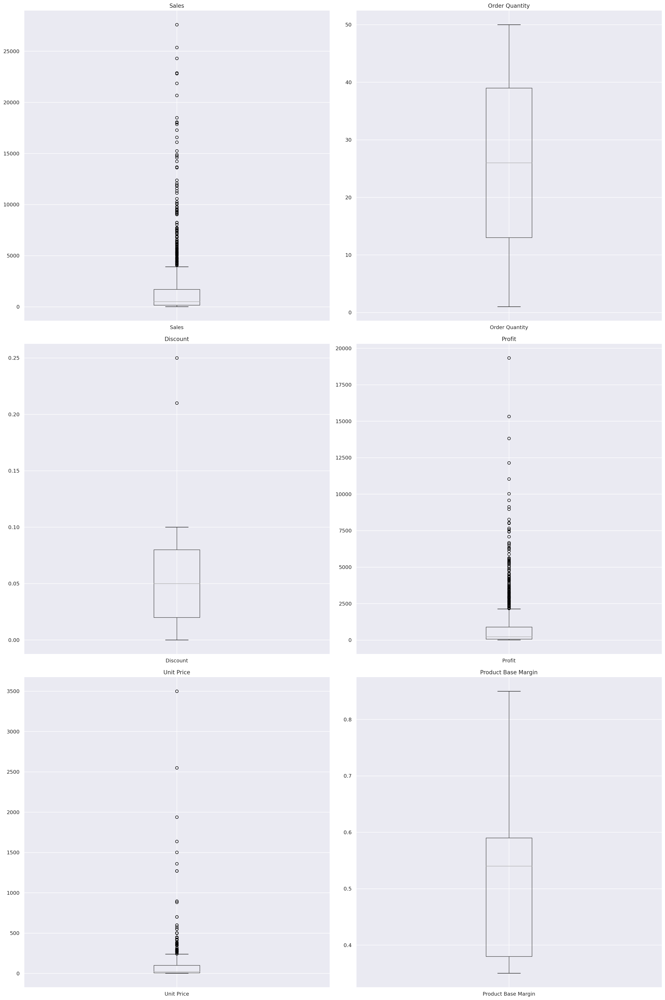

In [ ]:
num_data = sales_data[num_variables]

n_cols = 2  # Set the number of columns to 2
n_rows = -(-len(num_variables) // n_cols)  # Round up division

fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 10*n_rows))
axs = axs.flatten()

for i, col in enumerate(num_variables):
    num_data.boxplot(column=col, ax=axs[i])
    axs[i].set_title(col)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)

    # Hide the axis labels for the last row of subplots
    if i >= n_cols * (n_rows - 1):
        axs[i].set_xlabel('')

# Remove any empty subplots
for i in range(len(num_variables), len(axs)):
    axs[i].remove()

plt.tight_layout()
plt.show()

In [ ]:
def treat_outliers(data, columns, percentile_threshold):
    for col in columns:
        # Calculate the percentile value
        cutoff_value = data[col].quantile(percentile_threshold / 100)
        # Replace outliers with the cutoff value
        data[col] = data[col].clip(upper=cutoff_value)


percentile_threshold = 95

columns_to_treat = ['Sales', 'Discount', 'Profit','Unit Price']

treat_outliers(sales_data, columns_to_treat, percentile_threshold)

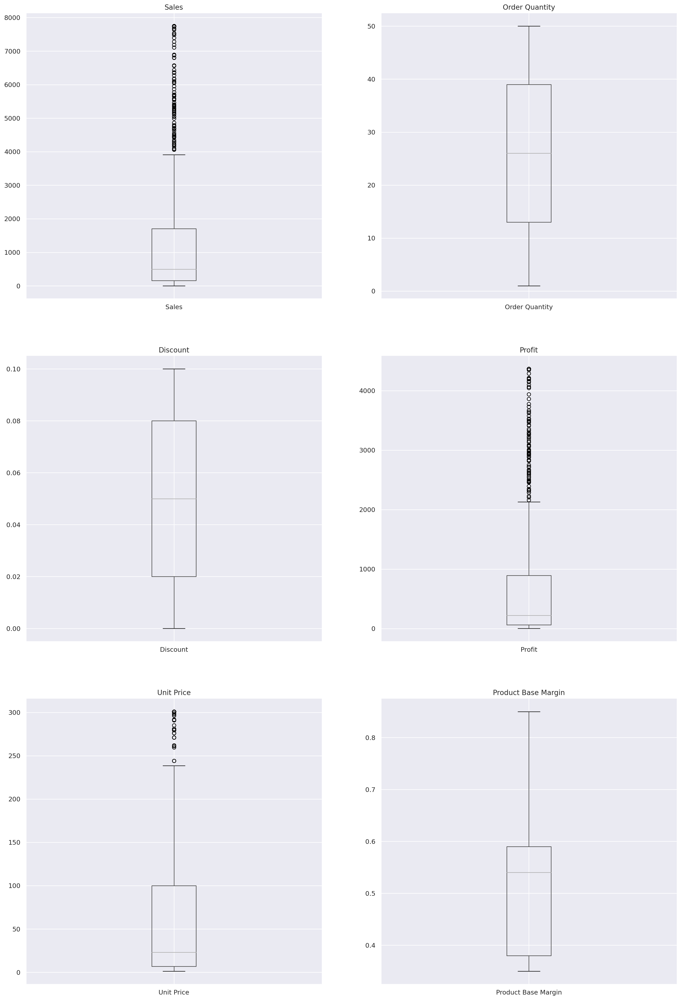

In [ ]:
num_data = sales_data[num_variables]

n_cols = 2
n_rows = -(-len(num_variables) // n_cols)  # Round up division

fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 10*n_rows))
axs = axs.flatten()

for i, col in enumerate(num_variables):
    num_data.boxplot(column=col, ax=axs[i])
    axs[i].set_title(col)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)

    # Hide the axis labels for the last row of subplots
    if i >= n_cols * (n_rows - 1):
        axs[i].set_xlabel('')

# Remove any empty subplots
for i in range(len(num_variables), len(axs)):
    axs[i].remove()

array([[<Axes: title={'center': 'Sales'}>,
        <Axes: title={'center': 'Order Quantity'}>],
       [<Axes: title={'center': 'Discount'}>,
        <Axes: title={'center': 'Profit'}>],
       [<Axes: title={'center': 'Unit Price'}>,
        <Axes: title={'center': 'Product Base Margin'}>]], dtype=object)

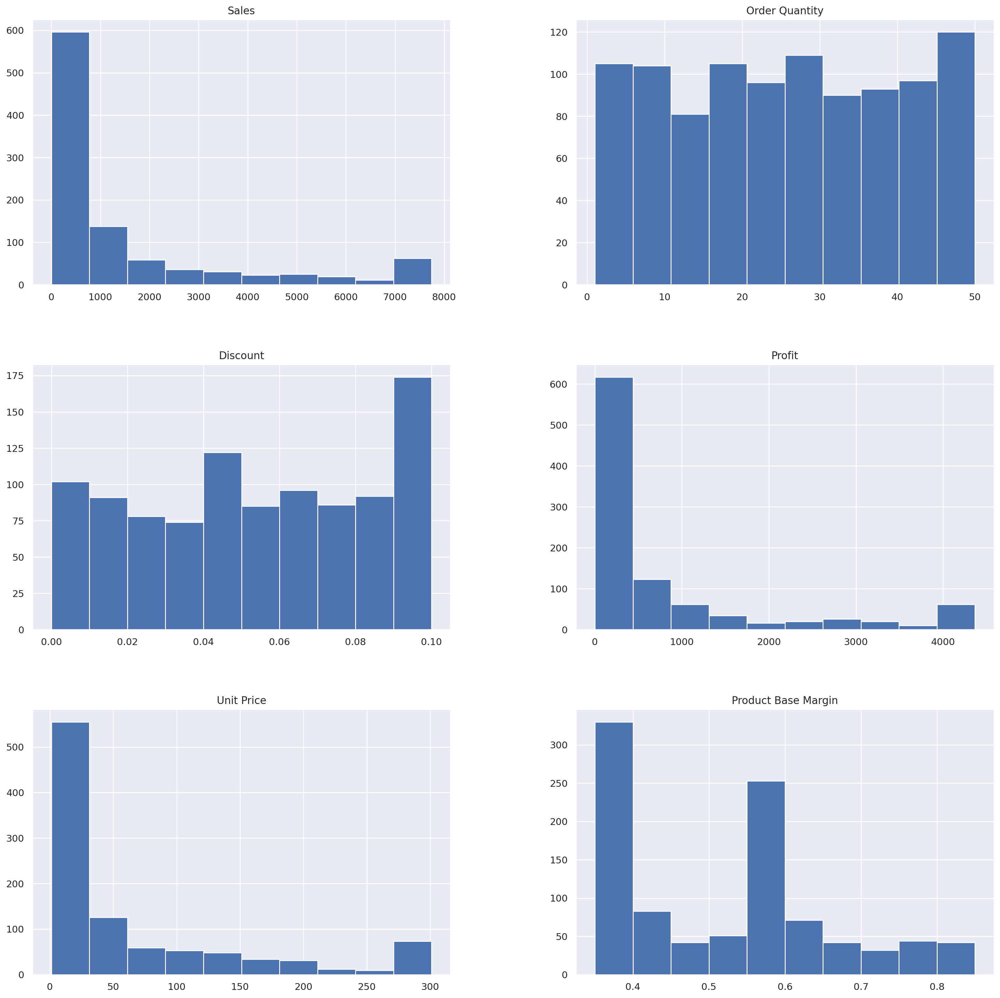

In [ ]:
sales_data.hist(num_variables, figsize=(20,20))

- Sales, Profit, Unit Price : Bimodal Distribution
- Order Quantity, Discount : Uniform Disctribution
- Product Base Margin : Multimodal Disctribution

3.3. Explore the relationship between sales and other variables using scatter plots.

Sales vs Order Quantity

Text(0.5, 1.0, 'Sales vs Order Quantity')

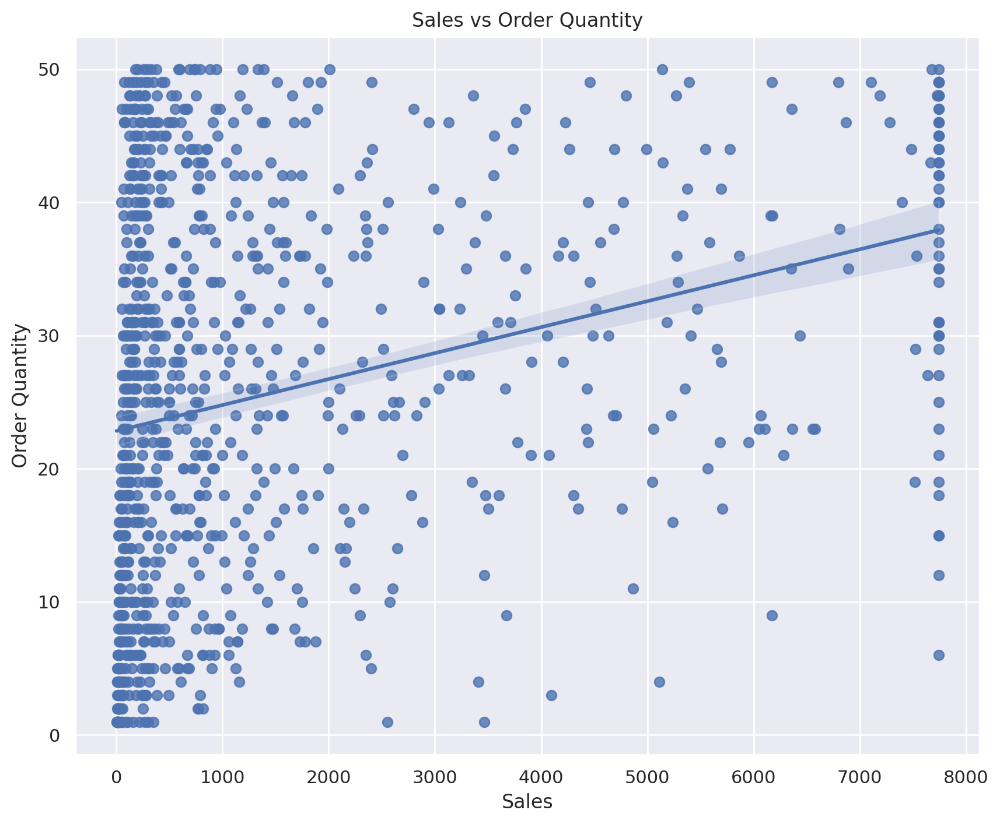

In [ ]:
sb.regplot(x="Sales", y="Order Quantity", data=sales_data, scatter=True)
plt.title('Sales vs Order Quantity')

Sales vs Discount

Text(0.5, 1.0, 'Sales vs Discount')

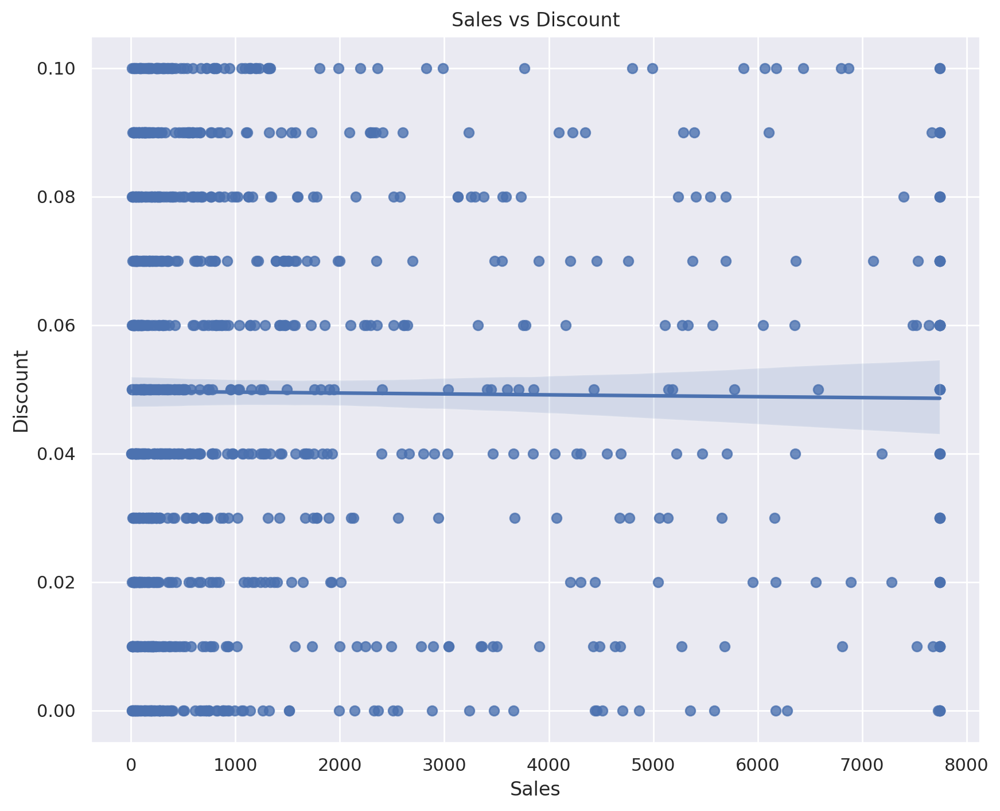

In [ ]:
sb.regplot(x="Sales", y="Discount", data=sales_data, scatter=True)
plt.title('Sales vs Discount')

Sales vs Profit

Text(0.5, 1.0, 'Sales vs Profit')

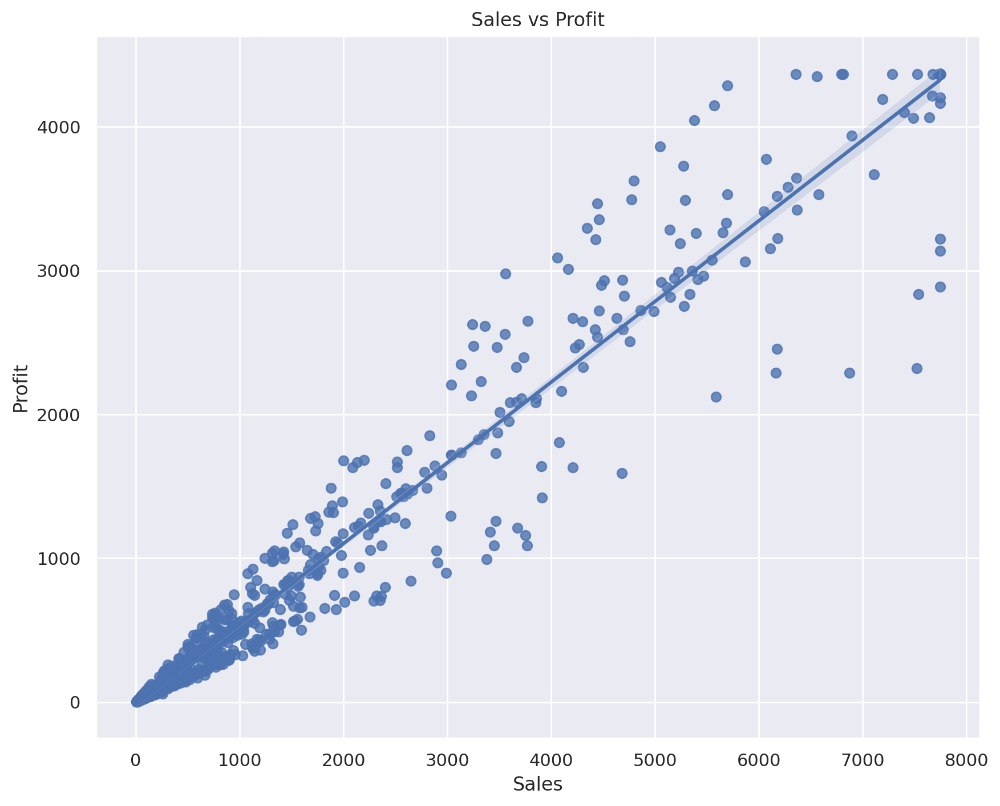

In [ ]:
sb.regplot(x='Sales', y='Profit', data=sales_data, scatter=True)
plt.title('Sales vs Profit')

Sales vs Unit Price

Text(0.5, 1.0, 'Sales vs Unit Price')

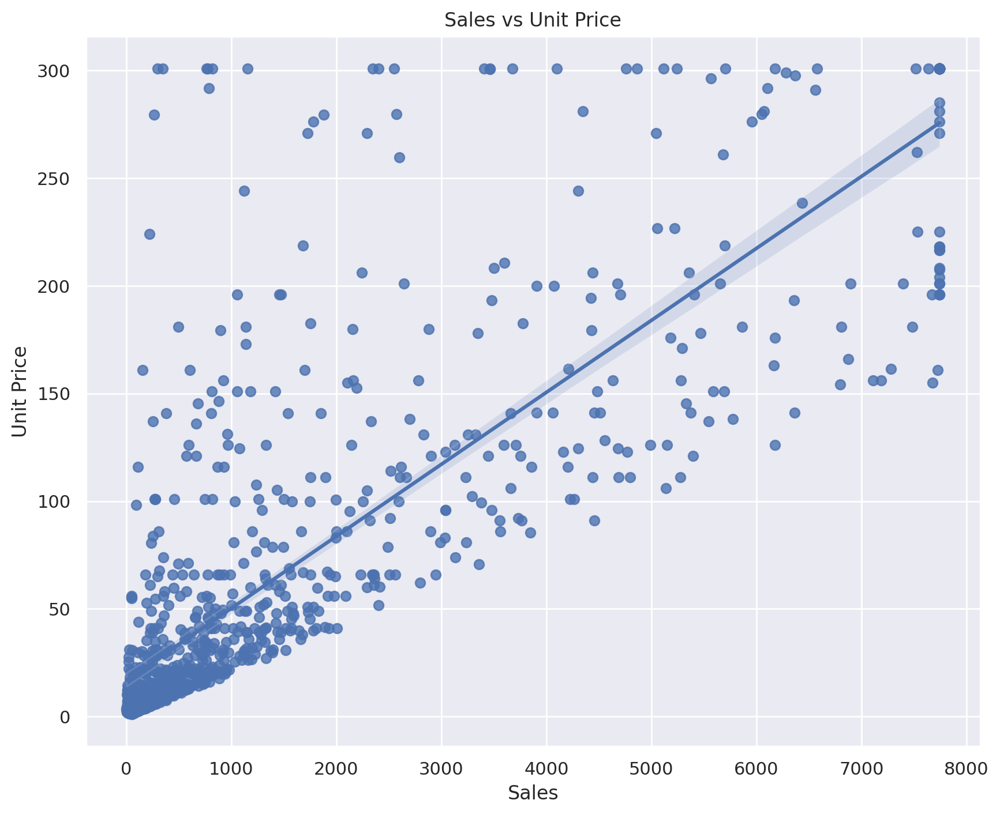

In [ ]:
sb.regplot(x='Sales', y='Unit Price', data=sales_data, scatter=True)
plt.title('Sales vs Unit Price')

Sales vs Product Base Margin

Text(0.5, 1.0, 'Sales vs Product Base Margin')

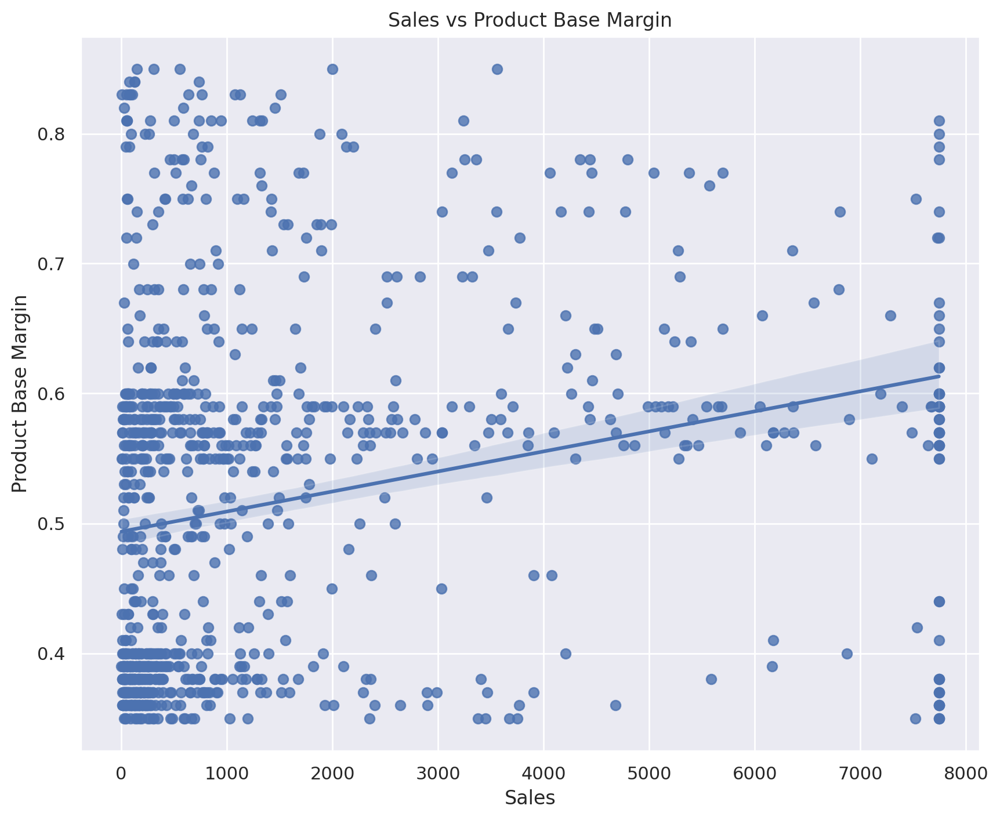

In [ ]:
sb.regplot(x='Sales', y='Product Base Margin', data=sales_data, scatter=True)
plt.title('Sales vs Product Base Margin')

3.4. Calculate and visualize the correlation matrix between numerical variables.

Sales, Order Quantity, Discount, Profit, Unit Price, Product Base Margin

In [ ]:
# Creating the correlation matrix
CorrelationData=num_data.corr()
CorrelationData

,Sales,Order Quantity,Discount,Profit,Unit Price,Product Base Margin
Sales,1.000000,0.287512,-0.009817,0.981013,0.833466,0.241322
Order Quantity,0.287512,1.000000,0.021934,0.281155,-0.068371,0.036731
Discount,-0.009817,0.021934,1.000000,-0.011076,0.012865,0.046610
Profit,0.981013,0.281155,-0.011076,1.000000,0.814178,0.340818
Unit Price,0.833466,-0.068371,0.012865,0.814178,1.000000,0.267423
Product Base Margin,0.241322,0.036731,0.046610,0.340818,0.267423,1.000000


Text(0.5, 1.0, 'Numerical Variables Heatmap')

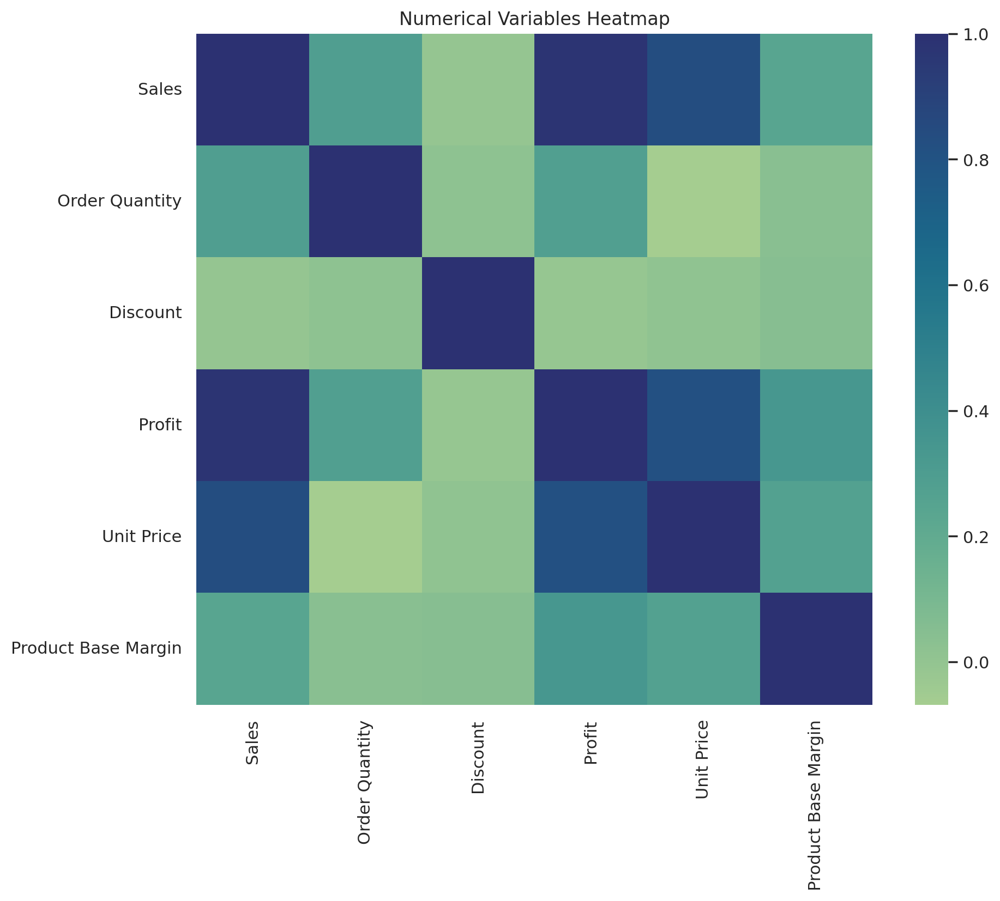

In [ ]:
sb.heatmap(CorrelationData,cmap="crest")
plt.title('Numerical Variables Heatmap')

In [ ]:
# Filtering only those columns where absolute correlation > 0.5 with Target Variable
CorrelationData['Sales'][abs(CorrelationData['Sales']) > 0.25 ]

Sales             1.000000
Order Quantity    0.287512
Profit            0.981013
Unit Price        0.833466
Name: Sales, dtype: float64

Analyzing the relationship between Sales and Discount within each segment separately.

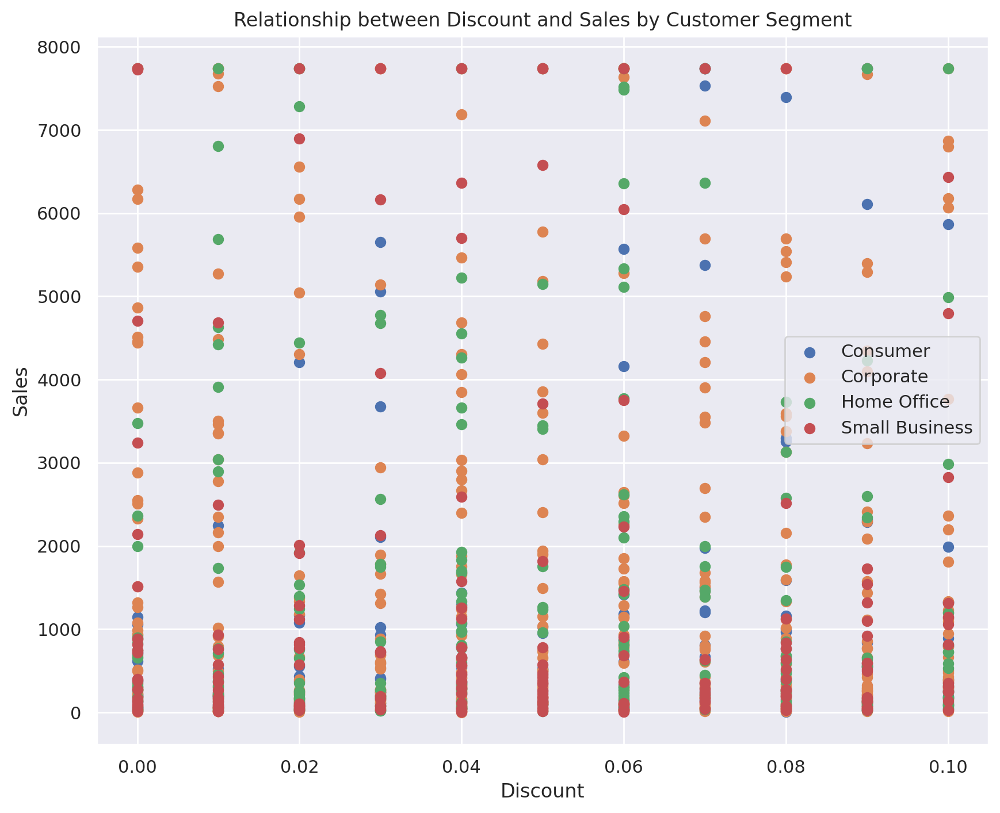

In [ ]:
# Group data by industry segment
grouped_data = sales_data.groupby('Customer Segment')

# Plot the relationship for each segment
for segment, group in grouped_data:
    plt.scatter(group['Discount'], group['Sales'], label=segment)


plt.xlabel('Discount')
plt.ylabel('Sales')
plt.title('Relationship between Discount and Sales by Customer Segment')
plt.legend()
plt.show()

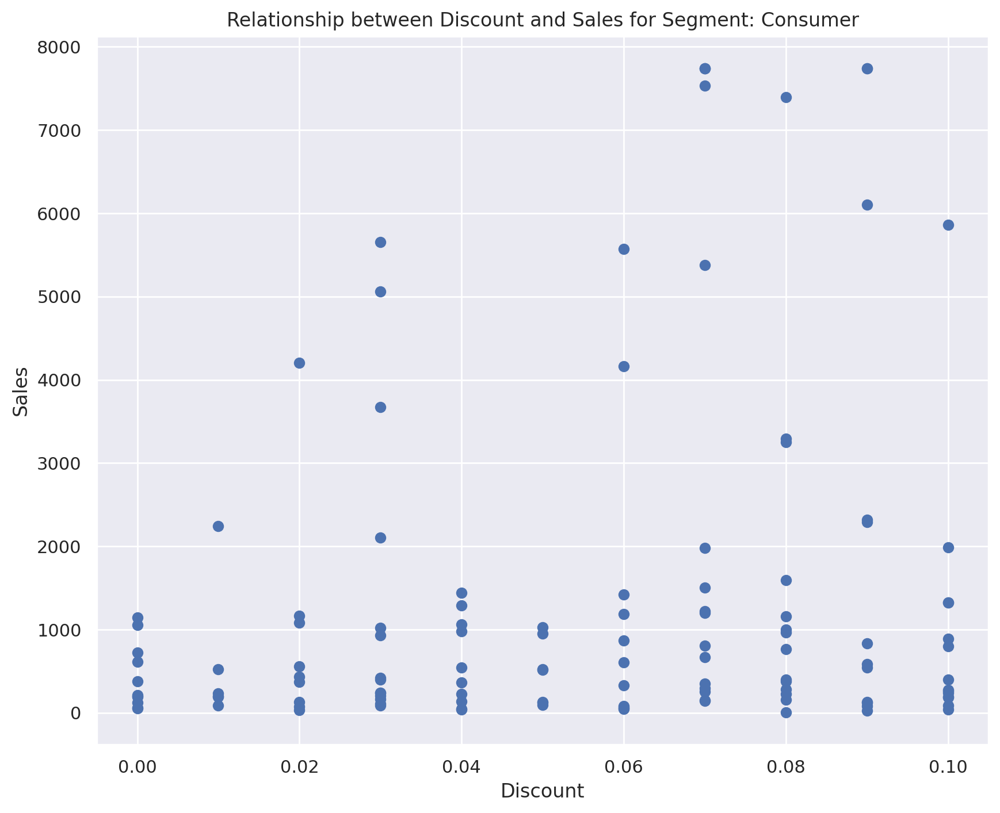

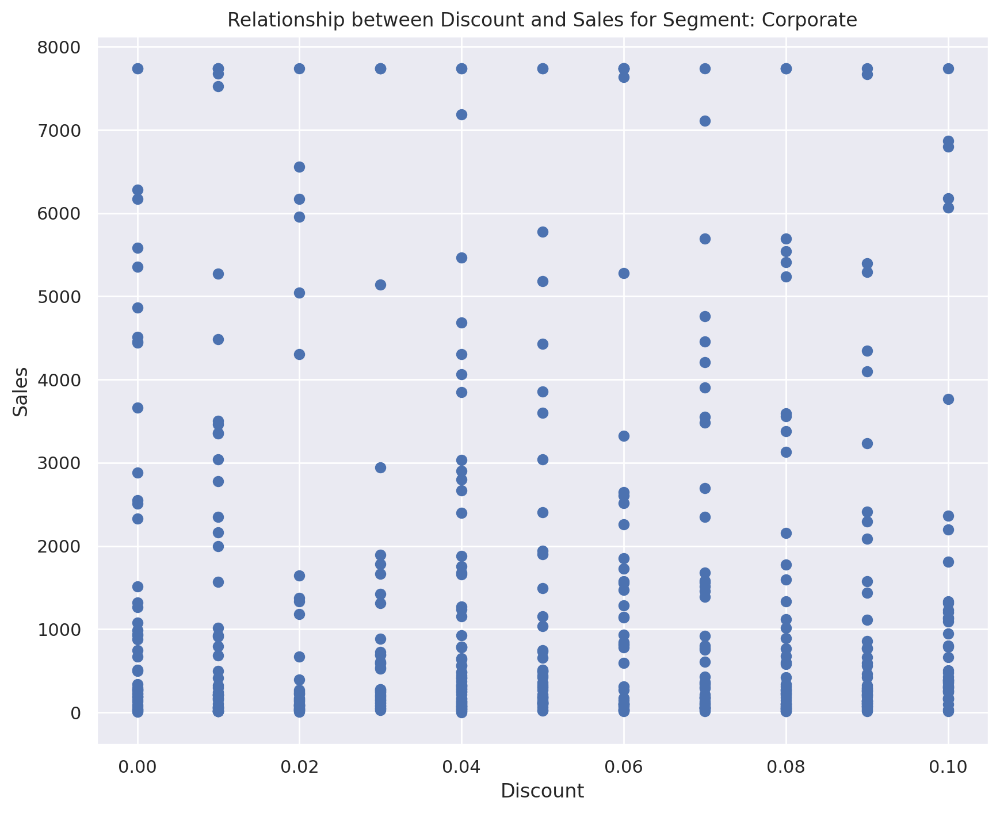

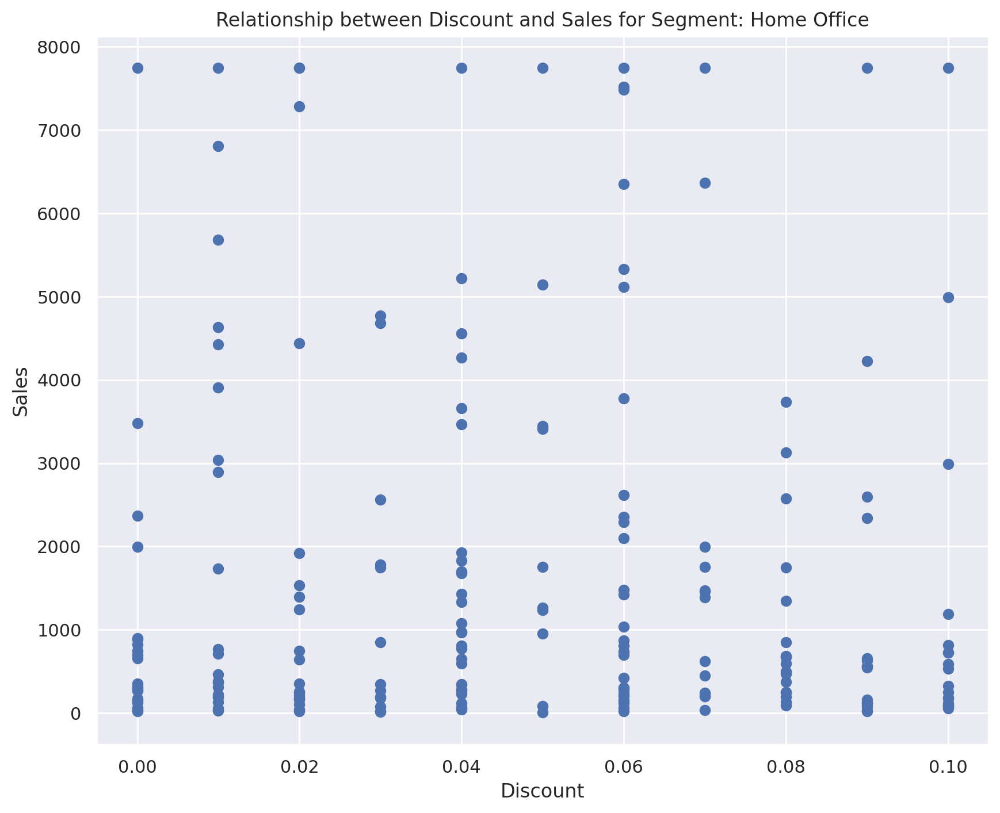

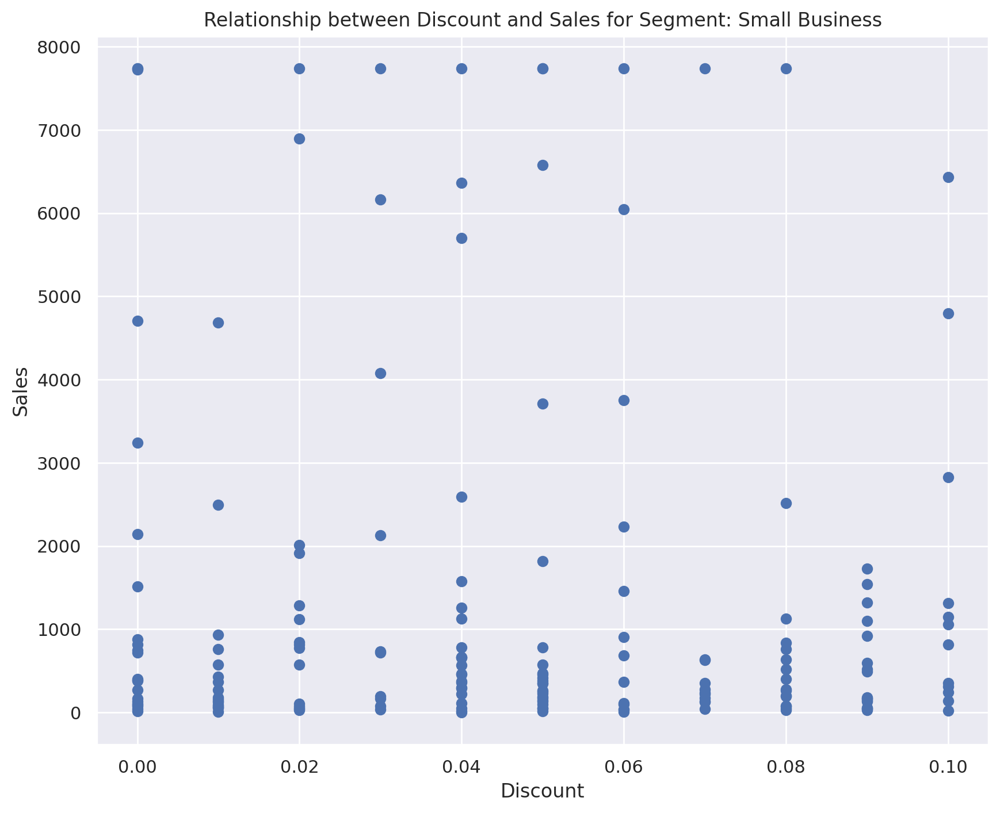

In [ ]:
# Create a separate scatter plot for each segment
for segment, group in grouped_data:

    plt.figure()
    plt.scatter(group['Discount'], group['Sales'])

    plt.xlabel('Discount')
    plt.ylabel('Sales')
    plt.title('Relationship between Discount and Sales for Segment: {}'.format(segment))

    plt.show()

There might be another factors at play influencing the relationship between Sales and Discount.
- Data quality
- Sample size
- Non-linear relationship

3.5. Analyze the sales trend over time using line plots or time series plots.

In [ ]:
sales_data.to_csv('sales_data1.csv', index=False)

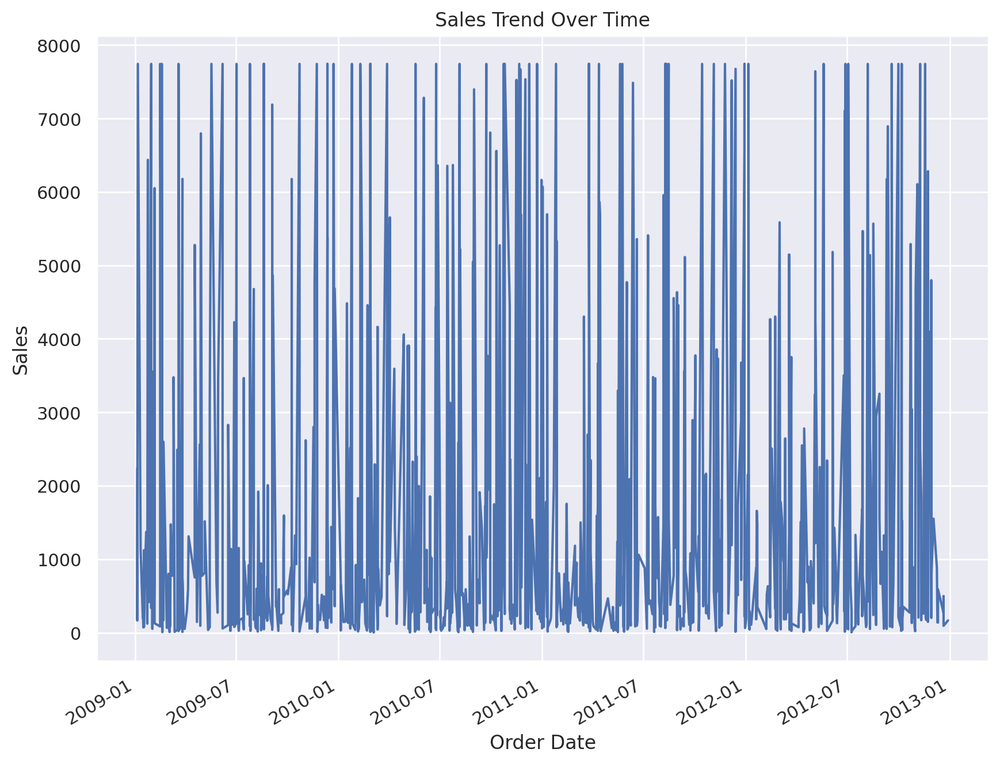

In [ ]:
# Read the CSV file with 'Order Date' as the index column and parse dates
sales_time = pd.read_csv('sales_data1.csv', index_col='Order Date', parse_dates=True)

# Sort the DataFrame by the index (Order Date)
sales_time.sort_index(inplace=True)

# Plot the 'Sales' column over time
sales_time['Sales'].plot()

plt.xlabel('Order Date')
plt.ylabel('Sales')
plt.title('Sales Trend Over Time')
plt.show()

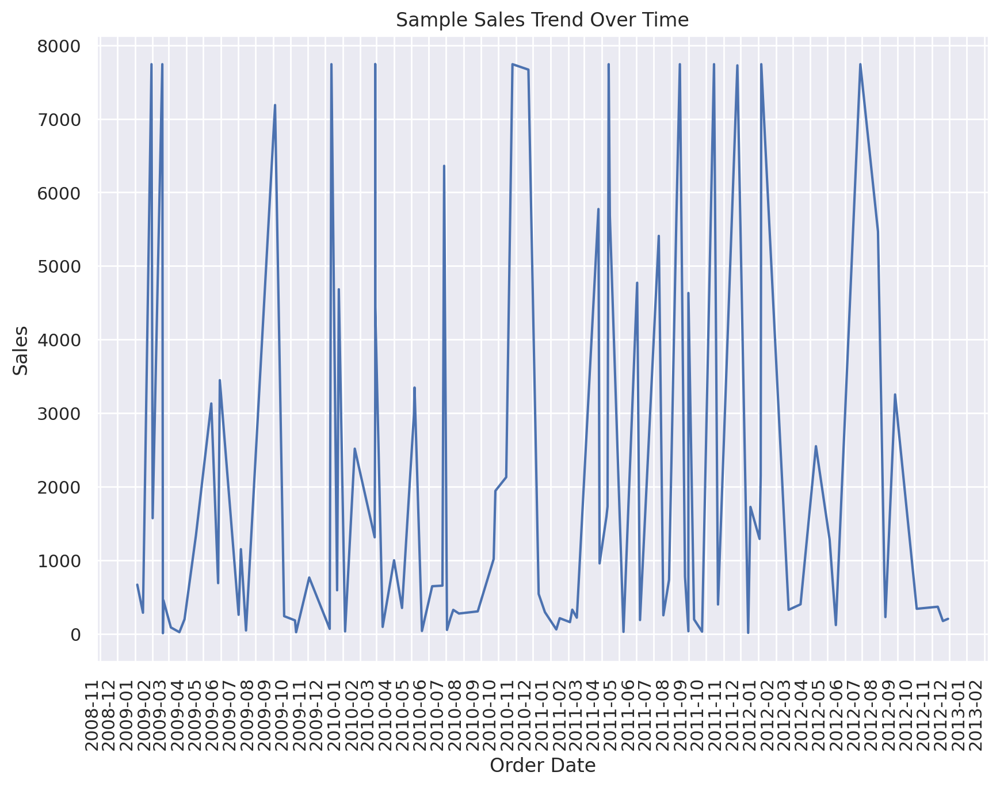

In [ ]:
import matplotlib.dates as mdates

# Take a sample from the sorted data
sales_time_sample = sales_time.sample(n=100, random_state=25, axis=0)
sales_time_sample.sort_index(inplace=True)
sales_time_sample['Sales'].plot()

plt.xlabel('Order Date')
plt.ylabel('Sales')
plt.title('Sample Sales Trend Over Time')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=90)
plt.show()

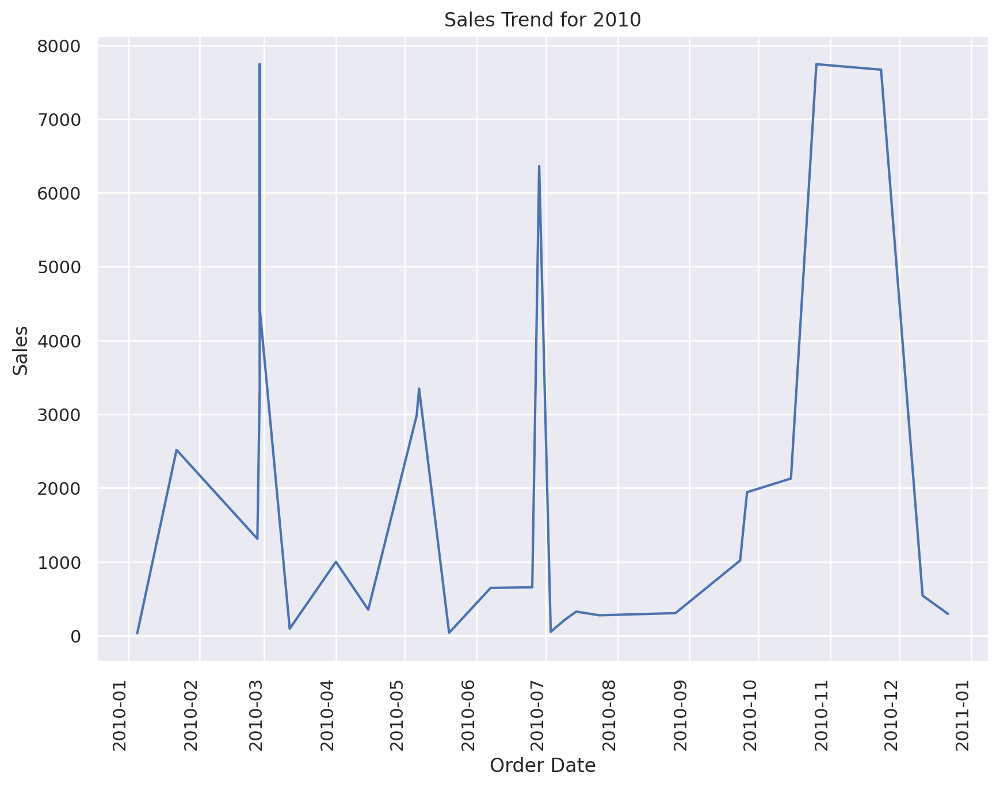

In [ ]:
year_to_visualize = 2010

sales_time_year = sales_time_sample[sales_time_sample.index.year == year_to_visualize]


sales_time_year['Sales'].plot()

plt.xlabel('Order Date')
plt.ylabel('Sales')
plt.title(f'Sales Trend for {year_to_visualize}')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.xticks(rotation=90)
plt.show()

### Level 4: Data Aggregation and Grouping

4.1 Group the sales data by product category and calculate the total sales amount for each category

In [ ]:
product_data = pd.read_csv('/content/products_table.csv')
sales_product = pd.merge(sales_data, product_data, on='Product ID', how='inner')
category_sales = sales_product.groupby('Product Category')['Sales'].sum()
print('Sales by the product category: ')
print(category_sales)

Sales by the product category: 
Product Category
Furniture          1.321839e+06
Office Supplies    7.656600e+05
Technology         1.345695e+06
Name: Sales, dtype: float64


4.2. Group the sales data by month and year and calculate the average sales amount for each month

In [ ]:
sales_data['Order Date'] = pd.to_datetime(sales_data['Order Date'])
sales_data['Month'] = sales_data['Order Date'].dt.month
sales_data['Year'] = sales_data['Order Date'].dt.year

avg_sales_m = sales_data.groupby(['Year', 'Month'])['Sales'].mean()
print(avg_sales_m)

Year  Month
2009  1        3043.529824
      2        2218.693826
      3        1172.292044
      4        1893.435245
      5        2339.522509
      6        2487.573462
      7        1395.689935
      8         982.637438
      9        1035.087178
      10       2102.334636
      11       1193.379333
      12       3417.197389
2010  1        1335.503269
      2        2392.313245
      3        1593.072168
      4        1771.191558
      5        1663.483179
      6        1971.190721
      7        1014.802640
      8         888.164726
      9        2354.680963
      10       2046.681895
      11       2367.830061
      12       2289.934991
2011  1        1547.654652
      2         409.366677
      3        1653.185238
      4        1616.016290
      5        1574.060458
      6        1280.005232
      7        1263.035767
      8        2719.936348
      9        1053.742642
      10       2463.661080
      11       3097.620753
      12       2421.461945
2012  1        1

4.3. Aggregate the sales data by region and calculate the total sales amount for each region.

In [ ]:
sales_by_region = sales_data.groupby('Region ID')
agg_by_region = sales_by_region.agg({'Sales': 'sum'})
print(agg_by_region)

                 Sales
Region ID             
1          206400.8709
2          452370.9841
3          479004.0835
4          654580.6073


4.4. Group the sales data by customer segment and calculate the average sales amount for each segment.

In [ ]:
customer_data = pd.read_csv('/content/customers_table.csv')

sales_customer = pd.merge(sales_data, customer_data, on='Customer ID', how='inner')
sales_by_segment = sales_customer.groupby('Customer Segment')['Sales'].mean()
print(sales_by_segment)

Customer Segment
Consumer          1687.537506
Corporate         1748.126758
Home Office       1751.321403
Small Business    1987.099692
Name: Sales, dtype: float64


4.5. Aggregate the sales data by sales representative and calculate the total sales amount for each representative.

In [ ]:
sales_by_rep = sales_product.groupby('Sales Representative')
agg_by_rep = sales_by_rep.agg({'Sales': 'sum'})
print(agg_by_rep)

                             Sales
Sales Representative              
1                     8.872012e+05
2                     1.245712e+06
3                     9.035902e+05
4                     3.966899e+05


### Level 5: Data Visualization with Matplotlib

5.1. Create a bar chart to visualize the total sales amount by product category.

<Figure size 1000x800 with 0 Axes>

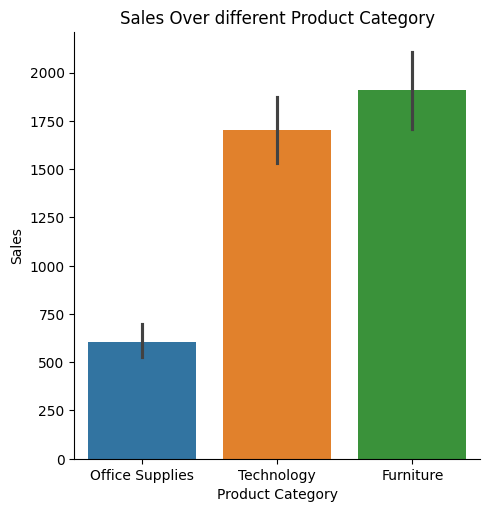

In [ ]:
# Barplot: Info about central tendency
plt.figure(figsize=(10, 8))
sns.catplot(x=new_df_cap['Product Category'], y=new_df_cap['Sales'], hue=new_df_cap['Product Category'], kind='bar', data=new_df_cap)
plt.title("Sales Over different Product Category")
plt.show()

5.2. Generate a line plot to show the sales trend over time.

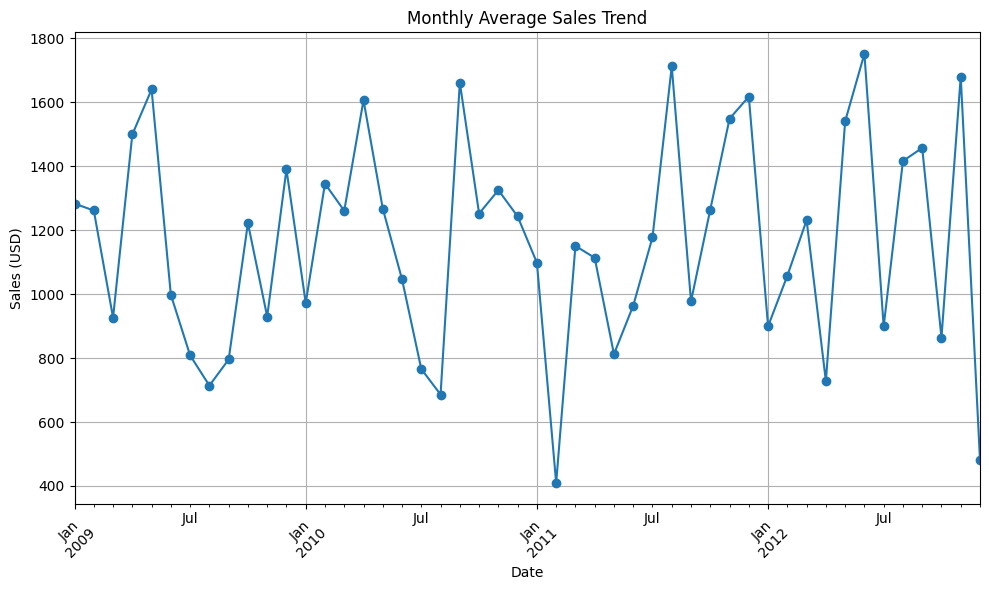

In [ ]:
df_line = pd.DataFrame(new_df_cap)
df_line['Order Date'] = pd.to_datetime(df['Order Date'])
df_line.set_index('Order Date', inplace=True)

# Resample data on monthly basis and calculate the mean
monthly_avg_sales = df_line['Sales'].resample('M').mean()

# Plot the data
plt.figure(figsize=(10, 6))
monthly_avg_sales.plot(marker='o', linestyle='-')
plt.title('Monthly Average Sales Trend')
plt.xlabel('Date')
plt.ylabel('Sales (USD)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

5.3. Create a pie chart to represent the distribution of sales across different regions.

In [ ]:
#3. Create a pie chart to represent the distribution of sales across different regions
sales_diff_regions = new_df_cap.groupby('Region')['Sales'].sum()
sales_diff_regions

Region
Central    295026.197375
East       395603.064700
South      158335.989150
West       309749.846075
Name: Sales, dtype: float64

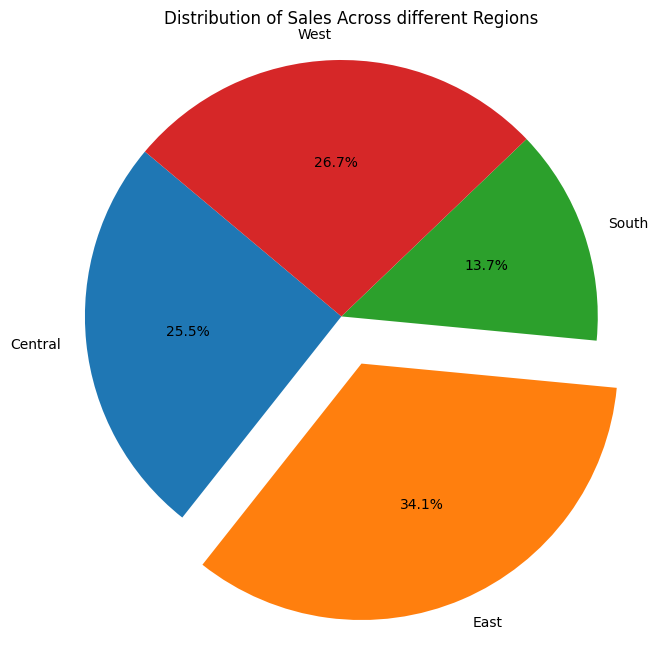

In [ ]:
# Set up the pie chart
plt.figure(figsize=(8, 8))
myexplode = [0, 0.2, 0, 0]

# Create the pie chart
plt.pie(sales_diff_regions, labels=sales_diff_regions.index, autopct='%1.1f%%', startangle=140, explode=myexplode)

# Add title
plt.title('Distribution of Sales Across different Regions')

# Show plot
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

5.4. Generate a boxplot to compare the sales performance of different customer segments

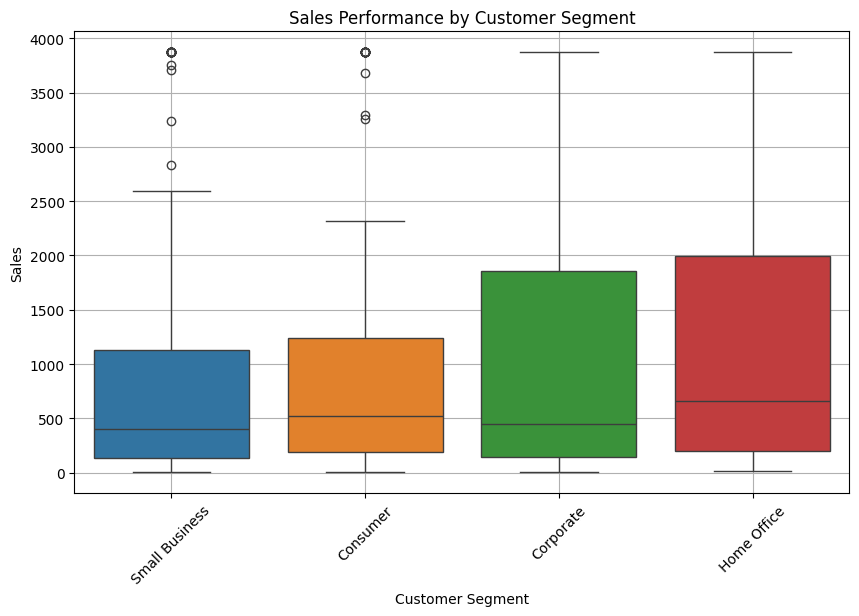

In [ ]:
#Generate a boxplot to compare the sales performance of different customer segments.

plt.figure(figsize=(10, 6))

sns.boxplot(x=new_df_cap['Customer Segment'], y=new_df_cap['Sales'], hue=new_df_cap['Customer Segment'], data=new_df_cap)


plt.title('Sales Performance by Customer Segment')
plt.xlabel('Customer Segment')
plt.ylabel('Sales')


plt.xticks(rotation=45)
plt.grid(True)
plt.show()

5.5. Visualize the relationship between sales and advertising expenditure using a scatter plot.

Text(0, 0.5, 'Sales')

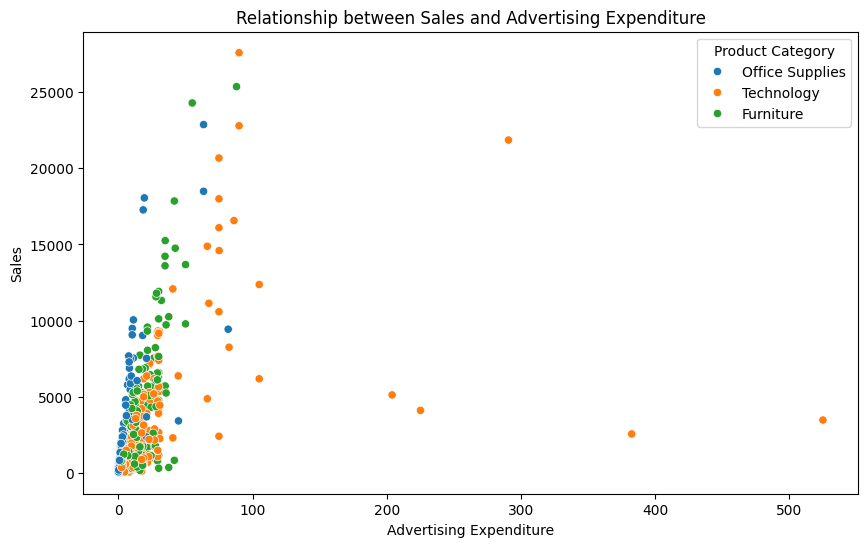

In [ ]:
#Visualize the relationship between sales and advertising expenditure using a scatter plot.
plt.figure(figsize=(10, 6))

# Create the scatter plot
sns.scatterplot(x=new_df_cap['Advertising Expenditure'], y=df['Sales'], hue=df['Product Category'],data=new_df_cap)


plt.title('Relationship between Sales and Advertising Expenditure')
plt.xlabel('Advertising Expenditure')
plt.ylabel('Sales')

### Level 6 : Advanced Data Manipulation with Numpy

6.1. Use Numpy to calculate the mean, median, and standard deviation of the sales data.

In [ ]:
sales_arr = np.round(np.array(sales), decimals=4) #the values were displayed with exponential notation when printing the array
np.set_printoptions(suppress=True)# to suppress the use of exponential notation while printing
print(sales_arr)

[  224.2944  9485.8512   232.2837  5409.324    380.7144   132.468
    84.972    856.0552  2697.8742   203.7816   190.674    121.344
   696.96    1427.8848    77.616   1779.8918   234.2112  4265.3952
   588.8025   930.459   2779.7418    43.173     93.9645   474.903
   176.529     78.624     61.4008 11137.2525   362.3424   274.0864
    59.202    809.1426   276.5373   498.7224  1017.4464  3480.1065
   182.83    5394.4982   501.876  13676.754     36.848    398.37
   927.92      14.256     37.9008  1330.4544   181.875     34.2612
  4632.903     54.747   1201.284     43.3422   122.892    105.378
    63.92     366.03     239.0256  3733.4704  1999.2675   202.8516
  9432.1728   248.832    111.9744   287.9745   202.1382   286.512
   401.12     124.83    1263.36     459.459    786.4128  5954.872
   744.325    932.4222  1155.7632   353.0466   139.968   3239.2
     8.648    239.112   3294.06     253.1088    86.0706  2799.696
  1878.1056 11324.1744    85.365   1533.8176   168.9996  4511.36
  9499.56

In [ ]:
order_quantity_arr = np.array(sales_data["Order Quantity"])
discount_arr = np.array(sales_data["Discount"])
unit_price_arr = np.array(sales_data["Unit Price"])

In [ ]:
profit_arr = np.round(np.array(sales_data["Profit"]), decimals=4)
np.set_printoptions(suppress=True)

In [ ]:
from scipy.stats import mode

def calculate_statistics(arr):
    mean = np.mean(arr)
    median = np.median(arr)

    # Calculate mode using scipy.stats.mode
    mode_result = mode(arr)
    mode_value = mode_result.mode.item()
    mode_count = mode_result.count.item()

    return round(mean, 2), round(median, 2), mode_value
sales_mean, sales_median, sales_mode = calculate_statistics(sales_arr)
print("Sales Statistics --->")
print("Sales Mean is:", sales_mean)
print("Sales Median is:", sales_median)
print("Sales Mode is:", sales_mode)

order_quantity_mean, order_quantity_median, order_quantity_mode = calculate_statistics(order_quantity_arr)
print("\nOrder Quantity Statistics --->")
print("Order Quantity Mean is:", order_quantity_mean)
print("Order Quantity Median is:", order_quantity_median)
print("Order Quantity Mode is:", order_quantity_mode)

discount_mean, discount_median, discount_mode = calculate_statistics(discount_arr)
print("\nDiscount Statistics --->")
print("Discount Mean is:", discount_mean)
print("Discount Median is:", discount_median)
print("Discount Mode is:", discount_mode)

profit_mean, profit_median, profit_mode = calculate_statistics(profit_arr)
print("\nProfit Statistics --->")
print("Profit Mean is:", profit_mean)
print("Profit Median is:", profit_median)
print("Profit Mode is:", profit_mode)

unit_price_mean, unit_price_median, unit_price_mode = calculate_statistics(unit_price_arr)
print("\nUnit Price Statistics --->")
print("Unit Price Mean is:", unit_price_mean)
print("Unit Price Median is:", unit_price_median)
print("Unit Price Mode is:", unit_price_mode)

Sales Statistics --->
Sales Mean is: 1792.36
Sales Median is: 498.62
Sales Mode is: 75.7344

Order Quantity Statistics --->
Order Quantity Mean is: 25.76
Order Quantity Median is: 26.0
Order Quantity Mode is: 31

Discount Statistics --->
Discount Mean is: 0.05
Discount Median is: 0.05
Discount Mode is: 0.04

Profit Statistics --->
Profit Mean is: nan
Profit Median is: nan
Profit Mode is: 4366.774

Unit Price Statistics --->
Unit Price Mean is: 67.06
Unit Price Median is: 22.98
Unit Price Mode is: 300.98


6.2. Perform element-wise arithmetic operations on the sales data (e.g., addition, subtraction, multiplication).

In [ ]:
Discounted_Unit_Price = unit_price_arr * (1-discount_arr)
sales_amount = order_quantity_arr * Discounted_Unit_Price
print("Sales Amount:", sales_amount)

Sales Amount: [  224.2944  9485.8512   232.2837  5409.324    380.7144   132.468
    84.972    856.0552  2697.8742   203.7816   190.674    121.344
   696.96    1427.8848    77.616   1779.8918   234.2112  4265.3952
   706.563    930.459   2779.7418    43.173     93.9645   474.903
   176.529     78.624     61.4008  7449.255    362.3424   274.0864
    59.202    809.1426   276.5373   498.7224  1017.4464  3480.1065
   182.83    5394.4982   501.876   8216.754     36.848    398.37
   927.92      14.256     37.9008  1330.4544   181.875     34.2612
  4632.903     54.747   1201.284     43.3422   122.892    105.378
    63.92     366.03     239.0256  3733.4704  1999.2675   202.8516
  1733.6448   248.832    111.9744   287.9745   202.1382   286.512
   401.12     124.83    1263.36     459.459    786.4128  5954.872
   744.325    932.4222  1155.7632   353.0466   139.968   3239.2
     8.648    239.112   3294.06     253.1088    86.0706  2799.696
  1878.1056 10618.5744    85.365   1533.8176   168.9996  451

In [ ]:
product_base_margin = np.array(sales_data['Product Base Margin'])
unit_cost = unit_price_arr * (1 - product_base_margin)
profit_amount = sales_amount - (order_quantity_arr * unit_cost)

print("Profit amount:", profit_amount)

Profit amount: [  177.5664  5201.9184    89.1594  2939.85     173.8044    44.6208
    30.66          nan        nan    67.9272    75.114     61.936
   348.48     996.5446    27.72     917.47      83.1072  2488.1472
   455.3406   524.6205  1600.4574    13.4316    74.1825   142.4709
   113.3502    40.608     31.3536  2784.065    207.592    143.0016
    44.252    258.237     99.7815   403.008    519.7824  1871.025
    67.6471  3260.411    167.292   4604.994     11.368    147.3969
   528.9144     5.04      21.7728   748.3806    63.75      11.4204
  2667.429     17.6407   427.1232    14.8852    40.1016    53.268
    38.352    113.876    130.3776  2394.2908  1676.805     63.2548
  1390.5276    82.944     38.4912   154.825     71.463    104.4575
   222.36      43.362    682.2144   348.381    368.631         nan
   258.555    451.7922   626.0384   117.6822    41.9904  2623.752
     2.726     69.0768  1826.055     81.648     71.2908  1487.3385
  1486.8336  5959.404     25.6095   563.4432    58.

6.3. Use Numpy to reshape the sales data into a different dimension.

In [ ]:
print('Sales Original Shape is : ', sales_arr.shape)

sales_arr_newshape = sales_arr.reshape((100,10))
print('Sales New Shape is : ', sales_arr_newshape.shape)

discount_arr_newshape = discount_arr.reshape((10,100))
print('\nDiscount New Shape is : ', discount_arr_newshape.shape)

unit_price_arr_newshape = unit_price_arr.reshape((1,10,100))
print('\nUnit Price New Shape is : ', unit_price_arr_newshape.shape)

Sales Original Shape is :  (1000,)
Sales New Shape is :  (100, 10)

Discount New Shape is :  (10, 100)

Unit Price New Shape is :  (1, 10, 100)


6.4. Apply broadcasting to perform operations on arrays with different shapes.

In [ ]:
# np.broadcast_arrays to align the shapes for broadcasting
broadcasted_sales, broadcasted_discount = np.broadcast_arrays(sales_arr_newshape[:, :, np.newaxis], discount_arr_newshape[np.newaxis, :, :])

# Perform operations using broadcasting
total_profit = broadcasted_sales * unit_price_arr_newshape - broadcasted_sales * broadcasted_discount

print("Shape of total profit:", total_profit.shape)

Shape of total profit: (100, 10, 100)


6.5. Use Numpy to perform matrix multiplication on sales data arrays.

In [ ]:
sales_dot_discount = np.dot(sales_arr_newshape,discount_arr_newshape) #(100,10) & (10,100)
sales_dot_discount.shape

(100, 100)

###  Level 7: Advanced Pandas Queries

7.1. Use Pandas to filter the sales data for a specific time period (e.g., quarter or year).

In [ ]:
sales_data['Order Date'] = pd.to_datetime(sales_data['Order Date'])
desired_year = 2012
# sales_data['Month'] = sales_data['Order Date'].dt.month
sales_data['Year'] = sales_data['Order Date'].dt.year
sales_by_dt = sales_data[sales_data['Year'] == desired_year]
print(sales_by_dt)

     Sales ID Product ID Customer ID       Sales Order Date  Order Quantity  \
1         102      OF_02    CG-12520   9485.8512 2012-10-01              49   
2         103      OF_03    DV-13045    232.2837 2012-10-01              27   
12        113      OF_04    AA-10480    696.9600 2012-06-08              32   
13        114      TE_02    IM-15070   1427.8848 2012-06-08              31   
14        115      OF_11    HP-14815     77.6160 2012-08-04              15   
17        118      FU_03    AG-10270   4265.3952 2012-02-14              44   
18        119      FU_04    ZD-21925    588.8025 2012-02-14              11   
19        120      TE_03    ZD-21925    930.4590 2012-04-15              15   
20        121      TE_04    ZD-21925   2779.7418 2012-04-15              18   
25        126      OF_16    EH-13945     78.6240 2012-08-04              30   
29        130      OF_19    TB-21520    274.0864 2012-10-21              49   
40        141      OF_24    SN-20710     36.8480 201

7.2. Apply boolean indexing to select rows based on multiple conditions.

In [ ]:
condition1 = sales_data['Order Quantity'] > 20
condition2 = sales_data['Sales'] > 500
condition3 = sales_data['Region ID'] == 2
condition4 = sales_data['Customer ID'].str.contains('BH')

# Combine conditions using logical AND (&)
combined_condition = condition1 & condition2 & condition3 & condition4

# Apply boolean indexing
selected_rows = sales_data[combined_condition]

# Display the selected rows
print('These are selected rows')
print(selected_rows)

These are selected rows
   Sales ID Product ID Customer ID      Sales Order Date  Order Quantity  \
7       108      OF_06    BH-11710   856.0552 2011-06-17              22   
8       109      OF_07    BH-11710  2697.8742 2011-03-24              21   

   Region ID  Month  Year  
7          2      6  2011  
8          2      3  2011  


7.3. Use Pandas groupby and aggregate functions to calculate custom metrics.

In [ ]:
# counting the number of unique 'Product ID' values for each 'Customer ID' in sales table.
unique_product = sales_data.groupby('Customer ID')['Product ID'].nunique()
print("Unique products ",unique_product)


#  Calculating the average 'Sales' amount for each 'Customer ID',
# then find the customer with the maximum average.

avg_sales = sales_data.groupby('Customer ID')['Sales'].mean()
max_sales_by_ID = avg_sales.idxmax()
max_sales_amount = avg_sales.max()

print("\nmax sales by the customer id: ",max_sales_by_ID)
print("max sales avg sales amount: ",max_sales_amount)


# Calculate the cumulative sum of the 'Sales' column to see the total sales amount over time.

total_sales = sales_data['Sales'][0:10].cumsum()
print("\nCummulative sum of sales ", total_sales)

Unique products  Customer ID
AA-10375     3
AA-10480     1
AB-10060     5
AB-10165     5
AC-10420     2
AD-10180     5
AF-10885     2
AG-10270     1
AG-10495     4
AG-10525     2
AG-10675     4
AG-10765     1
AG-10900     4
AH-10075     1
AH-10195     3
AH-10210     1
AJ-10780     2
AJ-10795     4
AJ-10945     1
AJ-10960     2
AM-10360     2
AP-10915     1
AR-10405     3
AR-10510     4
AR-10825     3
AS-10135     2
AS-10225     1
AS-10240     5
AS-10285     3
AS-10630     3
AT-10735     1
BB-10990     4
BB-11545     1
BD-11320     1
BD-11500     1
BD-11605     3
BD-11725     2
BE-11335     3
BF-11020     1
BH-11710     7
BK-11260     3
BM-11140     7
BM-11650     5
BM-11785     4
BN-11470     3
BN-11515     2
BP-11095     1
BP-11185     4
BS-11590     2
BS-11755     2
BS-11800     6
BV-11245     6
BW-11110     2
CA-12265     1
CA-12310     2
CA-12775     8
CB-12025     6
CB-12535     1
CC-12145     1
CC-12430     4
CC-12550     1
CC-12670     4
CD-11920     1
CD-11980     4
CG-12040   

7.4. Combine multiple DataFrames using merge or join operations.

In [ ]:
# combining all the tables into one and creating a new csv file for it

region_data = pd.read_csv('/content/regions_table.csv')
sales_and_product = pd.merge(sales_data, product_data, on='Product ID', how='outer')
salesP_and_customer = sales_and_product.join(customer_data.set_index('Customer ID'), on='Customer ID', how='left')
salesPC_and_region = salesP_and_customer.join(region_data.set_index('Region ID'), on='Region ID', how='outer')
joined_table = salesPC_and_region
print(salesPC_and_region[0:10:4])

    Sales ID Product ID Customer ID      Sales Order Date  Order Quantity  \
0        101      OF_01    CG-12520   224.2944 2010-10-13               6   
2        102      OF_02    CG-12520  9485.8512 2012-10-01              49   
15       104      TE_01    SO-20335  5409.3240 2011-07-10              30   

    Region ID  Month  Year                                       Product Name  \
0           1     10  2010   Eldon Base for stackable storage shelf, platinum   
2           1     10  2012  1.7 Cubic Foot Compact "Cube" Office Refrigera...   
15          1      7  2011                                               R380   

   Product Category  Sales Representative  Unit Price   Customer Name  \
0   Office Supplies                     1       38.94     Claire Gute   
2   Office Supplies                     1      208.16     Claire Gute   
15       Technology                     1      195.99  Sean O'Donnell   

                      Email ID Customer Segment                   Address

In [ ]:
joined_table.to_csv('Joined_table.csv', index=False)

### Level 10: Advanced Data Analysis Techniques with NumPy and Matplotlib

Visualize the original and smoothed time series using Matplotlib line plots.

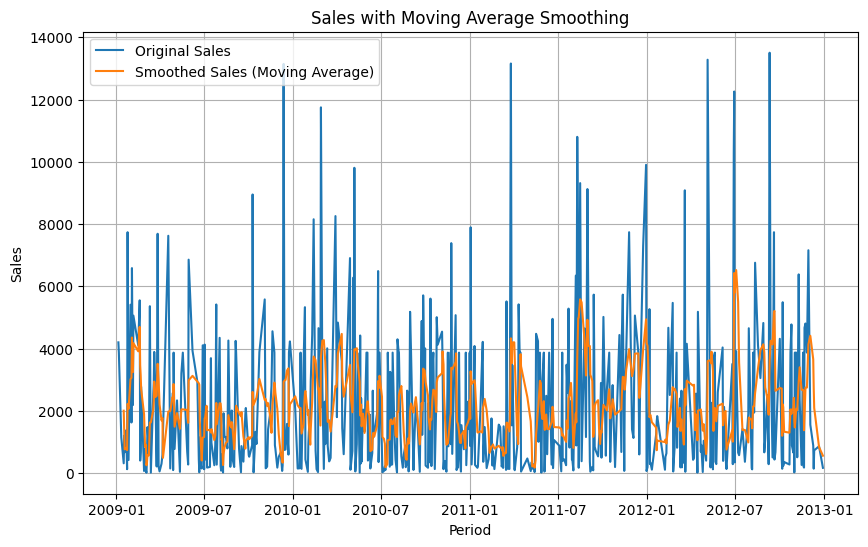

In [ ]:
# Group the data by week and sum the sales values
sales_data = df_line.groupby(df_line.index)['Sales'].sum()

# Smooth the sales data using moving average with window size 5 (adjust as needed)
window_size = 5
smoothed_sales = sales_data.rolling(window=window_size).mean()

# Plotting
plt.figure(figsize=(10, 6))

# Plot original sales data
sns.lineplot(x=sales_data.index, y=sales_data, label='Original Sales')

# Plot smoothed sales data
sns.lineplot(x=smoothed_sales.index, y=smoothed_sales, label='Smoothed Sales (Moving Average)')

# Customize the plot
plt.title('Sales with Moving Average Smoothing')
plt.xlabel('Period')
plt.ylabel('Sales')
plt.legend()  # Show legend
plt.grid(True)

# Show plot
plt.show()

<ipython-input-55-604970895489>:2: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  weekly_sales = df_line.groupby(df_line.index.week)['Sales'].sum()


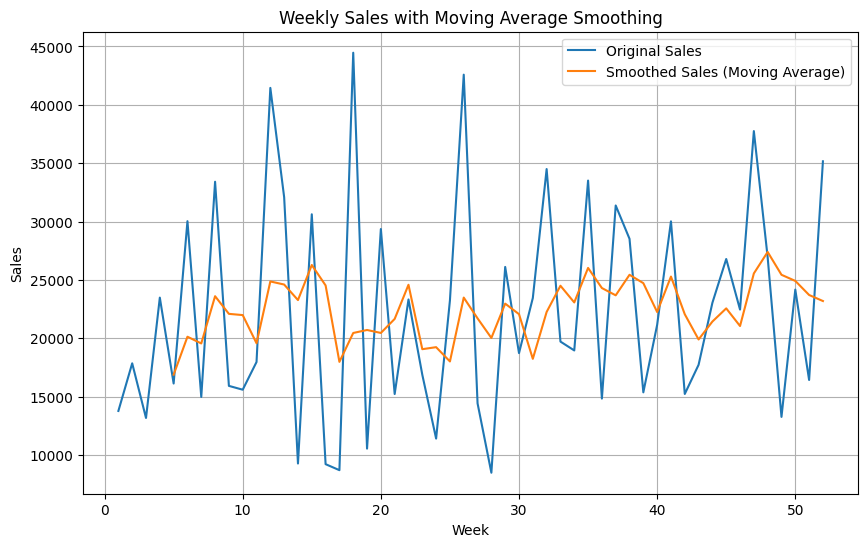

In [ ]:

# Group the data by week and sum the sales values
weekly_sales = df_line.groupby(df_line.index.week)['Sales'].sum()

# Smooth the sales data using moving average with window size 5 (adjust as needed)
window_size = 5
smoothed_sales = weekly_sales.rolling(window=window_size).mean()

# Plotting
plt.figure(figsize=(10, 6))

# Plot original sales data
sns.lineplot(x=weekly_sales.index, y=weekly_sales, label='Original Sales')

# Plot smoothed sales data
sns.lineplot(x=smoothed_sales.index, y=smoothed_sales, label='Smoothed Sales (Moving Average)')

# Customize the plot
plt.title('Weekly Sales with Moving Average Smoothing')
plt.xlabel('Week')
plt.ylabel('Sales')
plt.legend()  # Show legend
plt.grid(True)

# Show plot
plt.show()


 Create word frequency arrays to identify common themes in customer reviews.

In [ ]:
import nltk
from nltk.corpus import stopwords
from collections import Counter

# Download the stopwords corpus
nltk.download('stopwords')
nltk.download('punkt')

# Sample customer reviews
reviews = [
    "The product is excellent, highly recommend it!",
    "I love this product. It's amazing.",
    "Terrible customer service. Will not buy again.",
    "Great value for the price. Highly satisfied.",
    "Very disappointed with the quality. Not worth it.",
    "This item exceeded my expectations. Definitely worth the investment!",
    "I can't get enough of this product! It's simply outstanding.",
    "Horrible experience with customer support. Avoid at all costs.",
    "Exceptional value for the money. Couldn't be happier with my purchase.",
    "Absolutely appalled by the lack of quality. Complete waste of money.",
    "Awful customer experience. Will never buy from them again.",
    "Incredible value for the price. Extremely satisfied.",
    "Extremely disappointed with the quality. Definitely not worth it.",
    "This product surpassed my expectations. Definitely worth every penny!",
    "I'm obsessed with this product! It's simply phenomenal.",
    "Absolutely terrible customer service. Avoid at all costs.",
    "Remarkable value for money. Couldn't be happier with my purchase.",
    "Absolutely disgusted by the lack of quality. Total waste of money.",
    "The product is top-notch, highly recommend it!",
    "I'm in love with this product. It's absolutely remarkable.",
    "Horrible customer service experience. Will never return.",
    "Unbeatable value for the price. Completely satisfied.",
    "Completely let down by the quality. Not worth the money.",
    "This product exceeded all expectations. Definitely a wise investment!",
    "I'm completely hooked on this product! It's simply unbeatable.",
    "Dreadful customer service. Stay away at all costs.",
    "Outstanding value for the price. Delighted with my purchase.",
    "Utterly disappointed with the quality. Total waste of money.",
    "Absolutely phenomenal product. Highly recommend it!",
"This product is incredible. It's simply amazing.",
"Appalling customer service. Will never purchase again.",
"Exceptional value for money. Extremely satisfied.",
"Completely unsatisfied with the quality. Not worth it at all.",
"This product went above and beyond my expectations. Definitely worth every penny!",
"I'm absolutely obsessed with this product! It's outstanding.",
"Terrible experience with customer support. Avoid like the plague.",
"Unmatched value for the money. Couldn't be happier.",
"Completely shocked by the lack of quality. Waste of money.",
"Absolutely dreadful customer experience. Will never shop here again.",
"Remarkable value for the price. Completely satisfied.",
"Truly disappointed with the quality. Not worth the investment.",
"This product completely blew me away. Definitely a worthwhile investment!",
"I'm absolutely enamored with this product! It's unbeatable.",
"Avoid their customer service at all costs. It's abysmal.",
"Outstanding value for the price. Couldn't be happier.",
"Absolutely horrified by the lack of quality. Waste of money.",
"This product is top-notch. Highly recommended.",
"I'm head over heels for this product. It's truly remarkable.",
"Absolutely horrendous customer service experience. Never again.",
"Unbeatable value for the price. Completely satisfied.",
"Utterly let down by the quality. Not worth the money.",
"This product exceeded all expectations. Definitely worth it!",
"I'm absolutely hooked on this product! It's unparalleled.",
"Stay away from their customer service. It's atrocious.",
"Outstanding value for the price. Thrilled with my purchase.",
"Absolutely disgusted with the quality. Waste of money.",
"Phenomenal product. Highly recommend it!",
"This product is phenomenal. It's simply incredible.",
"Absolutely awful customer service. Never purchasing again.",
"Excellent value for the money. Extremely satisfied.",
"Completely unsatisfied with the quality. Not worth it.",
"This product exceeded my wildest expectations. Definitely worth every penny!",
"I'm absolutely in love with this product! It's exceptional.",
"Horrible experience with their customer support. Avoid at all costs.",
"Exceptional value for the price. Couldn't be happier.",
"Disgusted by the lack of quality. Total waste of money.",
"Top-notch product. Highly recommended.",
"This product is phenomenal. It's absolutely remarkable.",
"Absolutely horrendous customer service experience. Will never return.",
"Unmatched value for the price. Completely satisfied.",
"Completely disappointed with the quality. Not worth the investment.",
"This product went beyond my expectations. Definitely worth it!",
"I'm absolutely obsessed with this product! It's unbeatable.",
"Avoid their customer service like the plague. It's terrible.",
"Outstanding value for the price. Couldn't be happier.",
"Absolutely appalled by the lack of quality. Total waste of money.",
"This product is top-notch. Highly recommended.",
"I'm completely smitten with this product. It's truly outstanding.",
]

# Tokenization, normalization, and removing stopwords
stop_words = set(stopwords.words('english'))
word_freq = Counter()
for review in reviews:
    words = nltk.word_tokenize(review.lower())  # Tokenization and normalization
    words = [word for word in words if word.isalnum() and word not in stop_words]  # Remove non-alphanumeric characters and stopwords
    word_freq.update(words)

# Print the most common words and their frequencies
print("Most common words in the customer reviews:")
for word, freq in word_freq.most_common(10):  # Print top 10 most common words
    print(f"{word}: {freq}")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Most common words in the customer reviews:
product: 29
absolutely: 18
customer: 16
value: 16
quality: 16
money: 15
worth: 14
completely: 12
service: 11
price: 11


Visualize the word frequency distribution using Matplotlib histograms or word clouds.

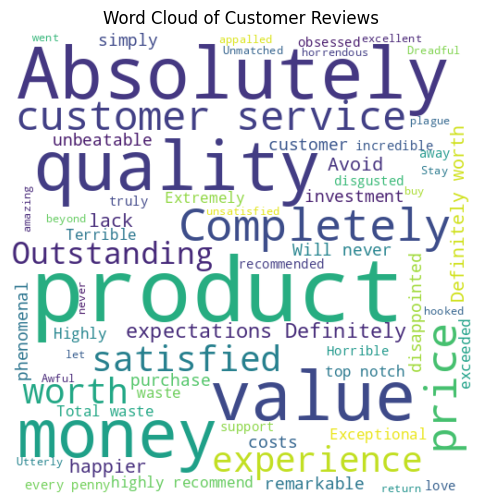

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Concatenate all reviews into a single string
all_reviews = ' '.join(reviews)

# Generate word cloud
wordcloud = WordCloud(width=500, height=500, min_font_size=10, background_color='white').generate(all_reviews)

# Display the word cloud using Matplotlib
plt.figure(figsize=(15, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axis
plt.title('Word Cloud of Customer Reviews')
plt.show()

Visualize statistical results using violin plots

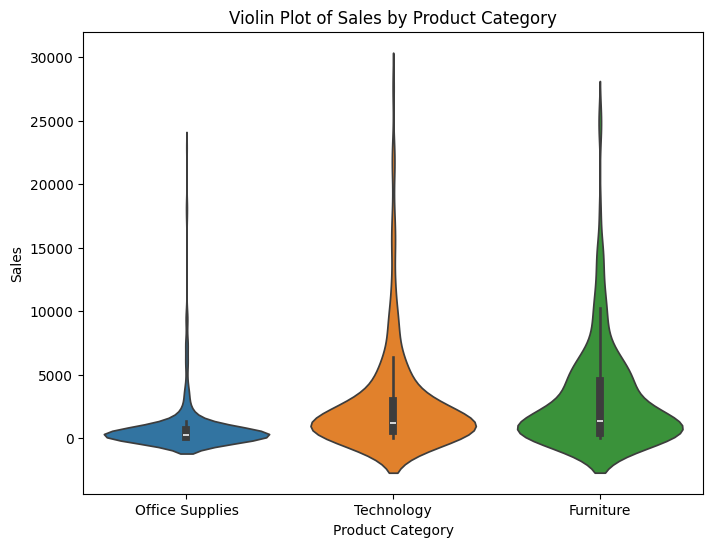

In [ ]:
plt.figure(figsize=(8, 6))
sns.violinplot(x='Product Category', y='Sales', hue='Product Category', data=df)
plt.title('Violin Plot of Sales by Product Category')
plt.xlabel('Product Category')
plt.ylabel('Sales')
plt.show()